# **Import Libraries**

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
from glob import glob
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns 
import matplotlib.gridspec as gridspec
import os
from keras.layers import Input
from keras.models import Model
from keras.layers import Dense
#from keras.optimizers import Adam
#from generator import DataGenerator
import keras

# **Import Dataset**

In [ ]:
from glob import glob
#import os # already imported earlier

my_images = glob('/content/drive/MyDrive/Images/image*/*.png')
print('Number of Observations: ', len(my_images)) # should equal 112,120

Number of Observations:  112120


In [ ]:
all_xray_df = pd.read_csv('/content/drive/MyDrive/Data_Entry_2017_v2020.csv')
print('Scans found:', len(my_images), ', Total Headers', all_xray_df.shape[0])
print('Total Headers', all_xray_df.shape[0])
all_xray_df.sample(5)


Scans found: 112120 , Total Headers 112120
Total Headers 112120


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y]
19814,00005275_000.png,No Finding,0,5275,59,M,AP,2500,2048,0.171,0.171
73128,00018011_004.png,No Finding,4,18011,38,M,AP,2500,2048,0.168,0.168
4037,00001100_000.png,No Finding,0,1100,52,M,PA,2500,2048,0.168,0.168
3024,00000798_036.png,Effusion,36,798,64,F,AP,2500,2048,0.168,0.168
83175,00020429_023.png,No Finding,23,20429,59,M,AP,3056,2544,0.139,0.139


**Saving images path**

In [ ]:
full_img_paths = {os.path.basename(x): x for x in my_images}
all_xray_df['full_path'] = all_xray_df['Image Index'].map(full_img_paths.get)


**Number of Unique Labels**

In [ ]:
num_unique_labels = all_xray_df['Finding Labels'].nunique()
print('Number of unique labels:',num_unique_labels)

# let's look at the label distribution to better plan our next step
count_per_unique_label = all_xray_df['Finding Labels'].value_counts() # get frequency counts per label
df_count_per_unique_label = count_per_unique_label.to_frame() # convert series to dataframe for plotting purposes


Number of unique labels: 836


**BarGraph of the 15 Labels**

(<matplotlib.axes._subplots.AxesSubplot at 0x7f2d30922d50>,
 (array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
  <a list of 15 Text major ticklabel objects>))

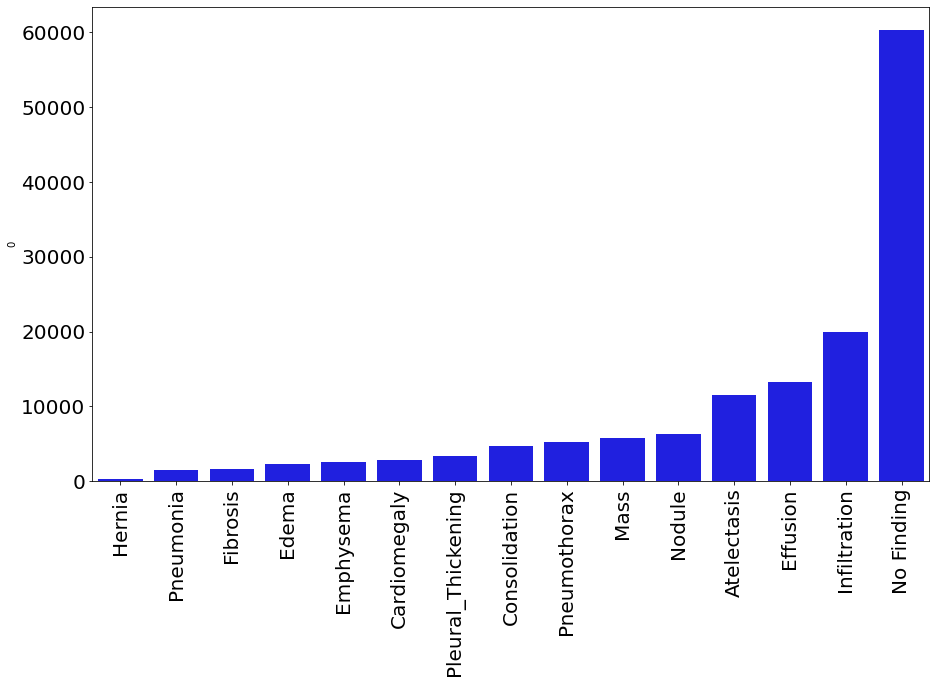

In [ ]:
labels = ['Atelectasis', 'Consolidation', 'Infiltration', 'Pneumothorax', 'Edema', 'Emphysema', 'Fibrosis', 'Effusion', 'Pneumonia', 'Pleural_Thickening', 
'Cardiomegaly', 'Nodule', 'Mass', 'Hernia','No Finding']
# One Hot Encoding of Finding Labels to dummy_labels
for l in labels:
    all_xray_df[l] = all_xray_df['Finding Labels'].apply(lambda x: 1 if l in x else 0)
#all_xray_df.head(20) # check the data, looking good!
clean_labels = all_xray_df[labels].sum().sort_values(ascending= True) # get sorted value_count for clean labels
plt.figure(figsize=(15,10))
gs = gridspec.GridSpec(8,1)
ax1 = plt.subplot(gs[:7, :])
ax1.xaxis.set_tick_params(labelsize=20)
ax1.yaxis.set_tick_params(labelsize=20)
clean_labels_df = clean_labels.to_frame() # convert to dataframe for plotting purposes
sns.barplot(x = clean_labels_df.index[::], y= 0, data = clean_labels_df[::], color = "blue" , ax=ax1,), plt.xticks(rotation = 90) # visualize results graphically  

In [ ]:
# let's look at the label distribution to better plan our next step
count_per_unique_label = all_xray_df['Finding Labels'].value_counts() # get frequency counts per label
df_count_per_unique_label = count_per_unique_label.to_frame() # convert series to dataframe for plotting purposes

In [ ]:
combination=[]
df = pd.DataFrame(combination)
  
# Declare a list that is to be converted into a column
out = [i for i in all_xray_df['Finding Labels'] if i not in labels]
  
# Using 'Address' as the column name
# and equating it to the list
df['Labels'] = out
print(df)

                                             Labels
0                            Cardiomegaly|Emphysema
1                             Cardiomegaly|Effusion
2                               Hernia|Infiltration
3                                       Mass|Nodule
4                             Effusion|Infiltration
...                                             ...
20791  Cardiomegaly|Effusion|Emphysema|Pneumothorax
20792               Cardiomegaly|Effusion|Emphysema
20793              Consolidation|Pleural_Thickening
20794                                   Mass|Nodule
20795                                Mass|Pneumonia

[20796 rows x 1 columns]


**BarGraph of the 15 labels combinations**

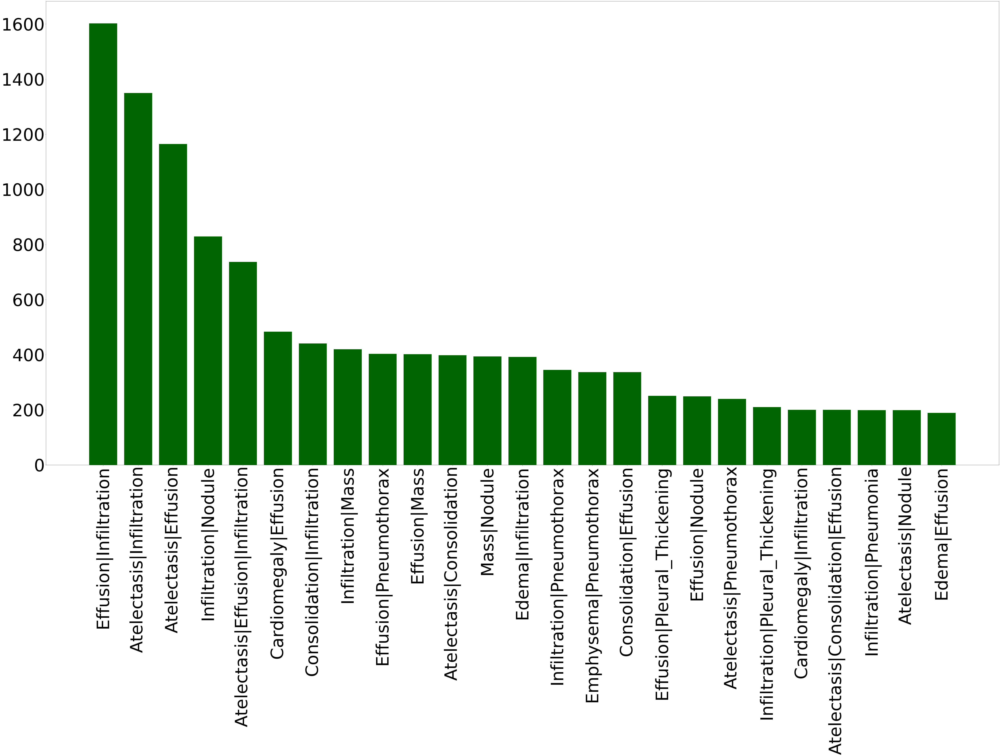

In [ ]:

label_counts = df['Labels'].value_counts()[:25]
fig, ax1 = plt.subplots(1,1,figsize = (100, 50))
ax1.bar(np.arange(len(label_counts))+0.5, label_counts,color='darkgreen')
ax1.xaxis.set_tick_params(labelsize=100)
ax1.yaxis.set_tick_params(labelsize=100)
ax1.set_xticks(np.arange(len(label_counts))+0.5)
_ = ax1.set_xticklabels(label_counts.index, rotation = 90)

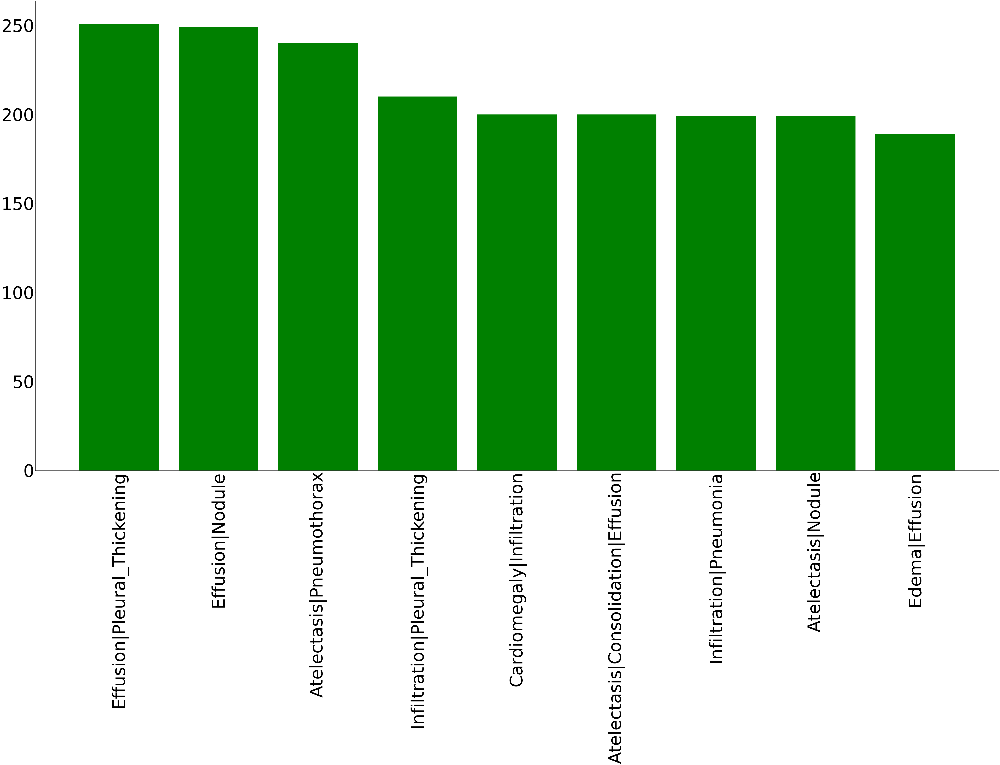

In [ ]:

label_counts = df['Labels'].value_counts()[16:25]
fig, ax1 = plt.subplots(1,1,figsize = (100, 50))
ax1.bar(np.arange(len(label_counts))+0.5, label_counts,color='green')
ax1.xaxis.set_tick_params(labelsize=100)
ax1.yaxis.set_tick_params(labelsize=100)
ax1.set_xticks(np.arange(len(label_counts))+0.5)
_ = ax1.set_xticklabels(label_counts.index, rotation = 90)

**Male and Female ratio of 15 Diseases**

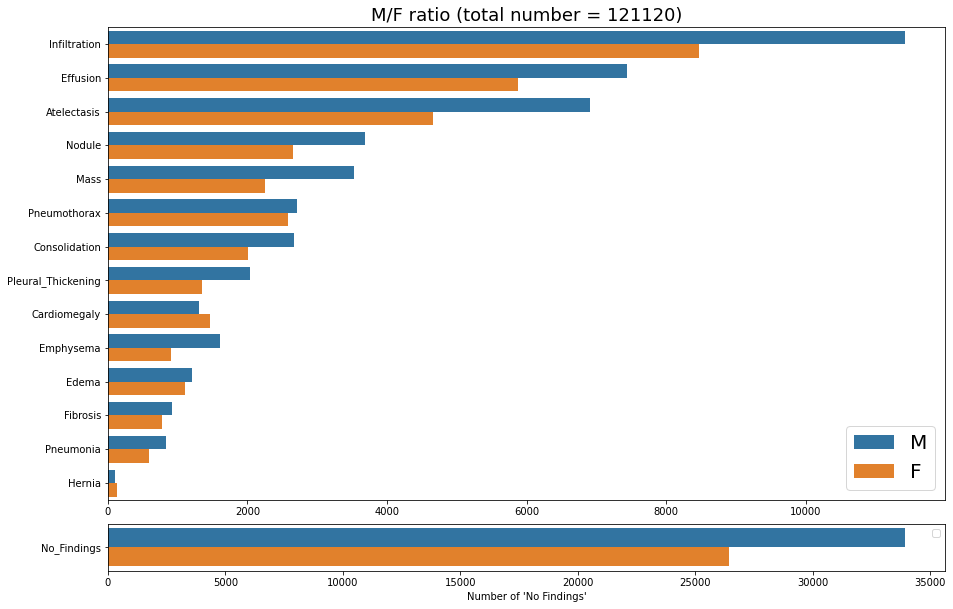

In [ ]:
pathology_list = ['Emphysema','Effusion','Hernia','Nodule','Pneumothorax','Atelectasis',
                  'Pleural_Thickening','Mass','Edema','Consolidation','Infiltration','Fibrosis','Pneumonia','Cardiomegaly']
for pathology in pathology_list :
    all_xray_df[pathology] = all_xray_df['Finding Labels'].apply(lambda x: 1 if pathology in x else 0)

plt.figure(figsize=(15,10))
gs = gridspec.GridSpec(8,1)
ax1 = plt.subplot(gs[:7, :])
ax2 = plt.subplot(gs[7, :])
data1 = pd.melt(all_xray_df,
             id_vars=['Patient Gender'],
             value_vars = list(pathology_list),
             var_name = 'Category',
             value_name = 'Count')
data1 = data1.loc[data1.Count>0]
g=sns.countplot(y='Category',hue='Patient Gender',data=data1, ax=ax1, order = data1['Category'].value_counts().index)
ax1.set( ylabel="",xlabel="")
ax1.legend(fontsize=20)
ax1.set_title('M/F ratio (total number = 121120)',fontsize=18);

all_xray_df['No_Findings']=all_xray_df['Finding Labels'].apply(lambda x: 1 if 'No Finding' in x else 0)

data2 = pd.melt(all_xray_df,
             id_vars=['Patient Gender'],
             value_vars = list(['No_Findings']),
             var_name = 'Category',
             value_name = 'Count')
data2 = data2.loc[data2.Count>0]
g=sns.countplot(y='Category',hue='Patient Gender',data=data2,ax=ax2)
ax2.set( ylabel="",xlabel="Number of 'No Findings'")
ax2.legend('')
plt.subplots_adjust(hspace=.5)
all_xray_df['Pneumonia'] = all_xray_df['Finding Labels'].map(lambda x: 'Pneumonia' in x)

# **NO FINDINGS**

In [ ]:
No_F= ['No_Findings']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[No_F].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [0.0]
2         [0.0]
3         [1.0]
4         [0.0]
          ...  
112115    [0.0]
112116    [1.0]
112117    [1.0]
112118    [1.0]
112119    [1.0]
Name: target_vector, Length: 112120, dtype: object

**Preprocess Images**

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='target_vector',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

KeyError: ignored

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


**Display sample images**

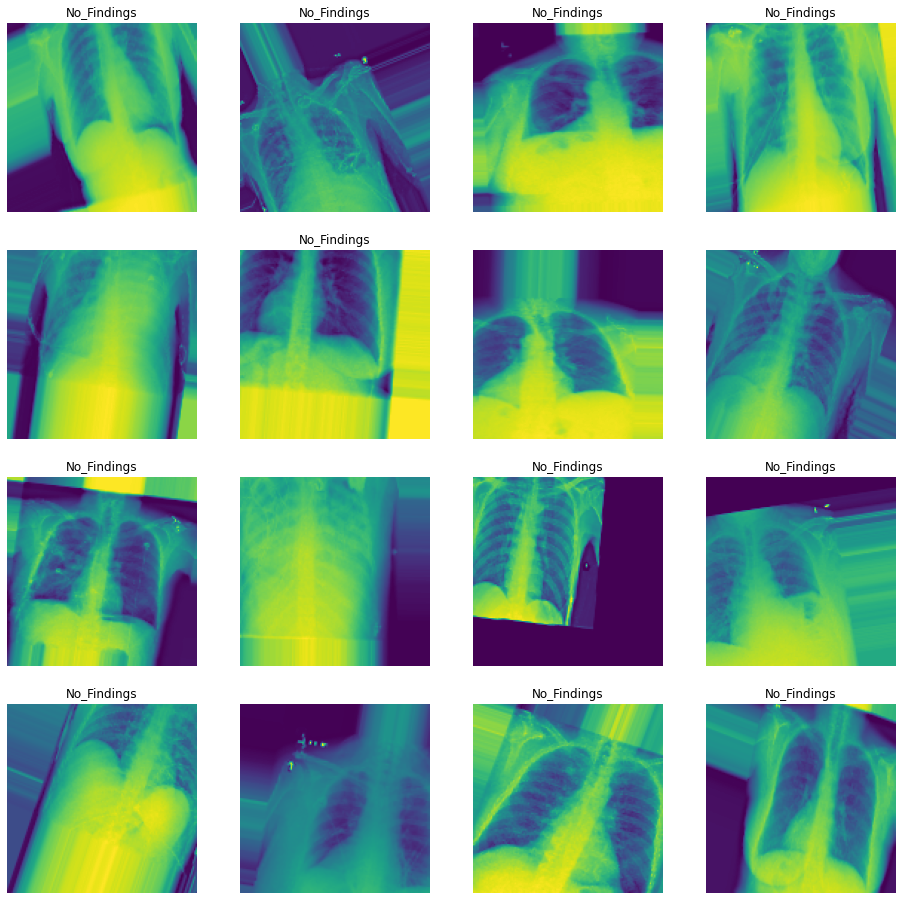

In [ ]:
t_x, t_y = next(flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(No_F, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


## **MOBILENET** 

In [ ]:
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  X_train.shape[1:], 
                                 include_top = False, weights = None)
mobilenet_GAP_model = Sequential()
mobilenet_GAP_model.add(mobilenet_model)
mobilenet_GAP_model.add(GlobalAveragePooling2D())
mobilenet_GAP_model.add(Dropout(0.5))
mobilenet_GAP_model.add(Dense(512))
mobilenet_GAP_model.add(Dropout(0.5))
mobilenet_GAP_model.add(Dense(1, activation = 'sigmoid'))
mobilenet_GAP_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
mobilenet_GAP_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d (G  (None, 1024)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense (Dense)               (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 1)                 5

In [ ]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}_weights.best.hdf5".format('xray_class')

checkpoint = ModelCheckpoint(weight_path, monitor='val_loss', verbose=1, 
                             save_best_only=True, mode='min', save_weights_only = True)

early = EarlyStopping(monitor="val_loss", 
                      mode="min", 
                      patience=3)
callbacks_list = [checkpoint, early]

In [ ]:
history_mobilenet_GAP = mobilenet_GAP_model.fit(X_train,y_train,
                                  steps_per_epoch=10,
                                  validation_data = (X_test, y_test), 
                                  epochs = 10, 
                                  callbacks = callbacks_list)

Epoch 1/10
10/10 [==============================] - ETA: 0s - loss: 1.5205 - binary_accuracy: 0.5694 - mae: 0.4339 
Epoch 00001: val_loss improved from inf to 0.70035, saving model to xray_class_weights.best.hdf5
10/10 [==============================] - 374s 37s/step - loss: 1.5205 - binary_accuracy: 0.5694 - mae: 0.4339 - val_loss: 0.7004 - val_binary_accuracy: 0.3262 - val_mae: 0.5035
Epoch 2/10
10/10 [==============================] - ETA: 0s - loss: 0.8851 - binary_accuracy: 0.5792 - mae: 0.4360 
Epoch 00002: val_loss improved from 0.70035 to 0.68631, saving model to xray_class_weights.best.hdf5
10/10 [==============================] - 356s 36s/step - loss: 0.8851 - binary_accuracy: 0.5792 - mae: 0.4360 - val_loss: 0.6863 - val_binary_accuracy: 0.6738 - val_mae: 0.4965
Epoch 3/10
10/10 [==============================] - ETA: 0s - loss: 0.8107 - binary_accuracy: 0.6226 - mae: 0.4096 
Epoch 00003: val_loss did not improve from 0.68631
10/10 [==============================] - 353s 36s

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[0.08899266],
       [0.08899266],
       [0.08899266],
       ...,
       [0.08899266],
       [0.08899266],
       [0.08899266]], dtype=float32)

In [ ]:
min(y_pred)

array([0.0889926], dtype=float32)

In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.44970703125


In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.4999277433675637


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>0.0889926))
print(classification_report(test_y2, y_pred>0.0889926, target_names = ['No Findings', 'Findings']))

NameError: ignored

## **Label- Atelectasis**

In [ ]:
Atelectasis= ['Atelectasis']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Atelectasis].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [0.0]
2         [0.0]
3         [0.0]
4         [0.0]
          ...  
112115    [0.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='Atelectasis',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 15906 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


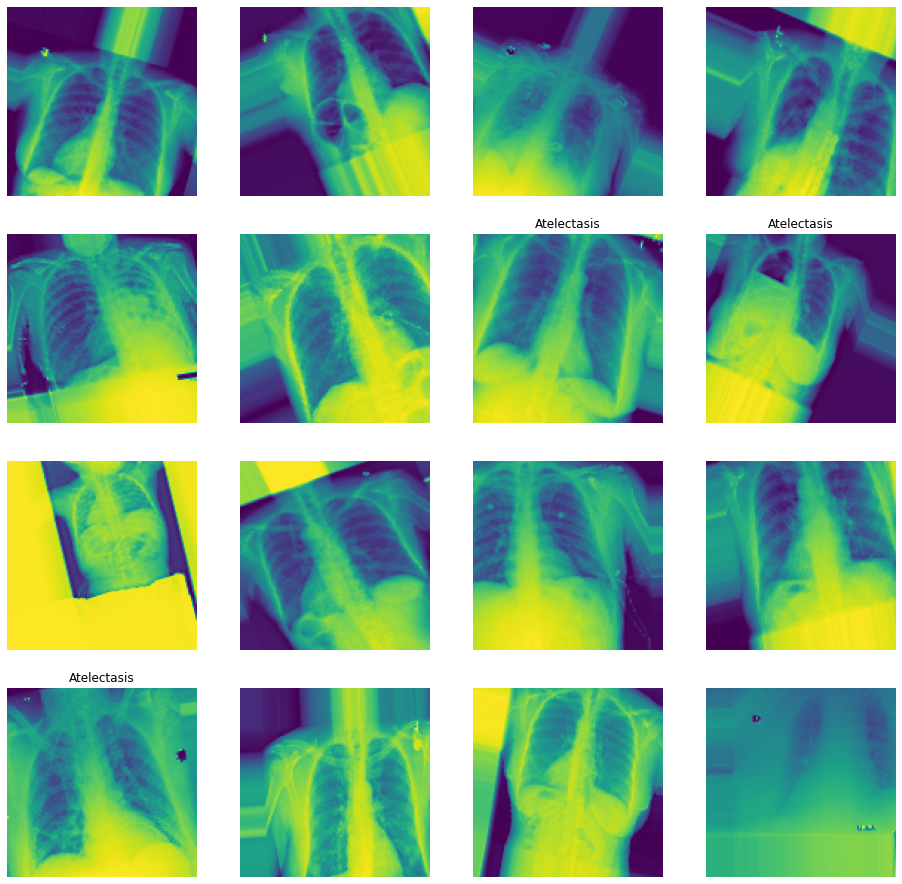

In [ ]:
t_x, t_y = next(flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(Atelectasis, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(y_train)) : 
  x.append(y_train[i]) 

for i in range(len(y_test)) : 
  y.append(y_test[i])   

for i in range(len(t_y)) : 
  a.append(t_y[i])   

In [ ]:
np.array(x).shape


(16, 1)

In [ ]:
np.array(y).shape

(2048, 1)

In [ ]:
np.array(a).shape

(16, 1)

In [ ]:
train_y2 = np.reshape(x, (16,1))
test_y2 = np.reshape(y, (2048,1))
t_y2 = np.reshape(a, (16,1))

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(Atelectasis), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_1   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_2 (Dropout)         (None, 1024)              0         
                                                                 
 dense_2 (Dense)             (None, 512)               524800    
                                                                 
 dropout_3 (Dropout)         (None, 512)               0         
                                                                 
 dense_3 (Dense)             (None, 1)                

In [ ]:
history = multi_disease_model.fit(X_train,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (t_x, t_y2), 
                                  epochs = 10)
                                  

Epoch 1/10
10/10 [==============================] - 5s 233ms/step - loss: 1.1372 - binary_accuracy: 0.8500 - mae: 0.1551 - val_loss: 0.5479 - val_binary_accuracy: 0.8125 - val_mae: 0.4072
Epoch 2/10
10/10 [==============================] - 2s 180ms/step - loss: 0.9832 - binary_accuracy: 0.9500 - mae: 0.0500 - val_loss: 0.5027 - val_binary_accuracy: 0.8125 - val_mae: 0.3585
Epoch 3/10
10/10 [==============================] - 2s 179ms/step - loss: 0.3603 - binary_accuracy: 0.9500 - mae: 0.0548 - val_loss: 0.6068 - val_binary_accuracy: 0.8125 - val_mae: 0.4510
Epoch 4/10
10/10 [==============================] - 2s 175ms/step - loss: 0.4673 - binary_accuracy: 0.9500 - mae: 0.0843 - val_loss: 0.5142 - val_binary_accuracy: 0.8125 - val_mae: 0.3734
Epoch 5/10
10/10 [==============================] - 2s 175ms/step - loss: 0.5228 - binary_accuracy: 0.9000 - mae: 0.1075 - val_loss: 0.7655 - val_binary_accuracy: 0.1875 - val_mae: 0.5332
Epoch 6/10
10/10 [==============================] - 2s 176ms

In [ ]:
y_pred = multi_disease_model.predict(X_test)

In [ ]:
y_pred

array([[0.3849476 ],
       [0.38494763],
       [0.3849476 ],
       ...,
       [0.38494763],
       [0.38494763],
       [0.38494763]], dtype=float32)

In [ ]:
Atelectasis

['Atelectasis']

In [ ]:
min(y_pred)

array([0.3849476], dtype=float32)

In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(X_test,test_y2, verbose=0)[1])

test accuracy =  0.8916015625


In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.5082603139832056


                precision    recall  f1-score   support

   Atelectasis       0.89      0.77      0.83      1826
No Atelectasis       0.12      0.25      0.16       222

      accuracy                           0.71      2048
     macro avg       0.50      0.51      0.49      2048
  weighted avg       0.81      0.71      0.76      2048



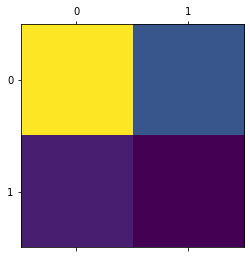

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>0.3849476))
print(classification_report(test_y2, y_pred>0.3849476, target_names = ['No Atelectasis', ' Atelectasis']))

## **Label- Cardiomegaly**

In [ ]:
Card= ['Cardiomegaly']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Card].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [1.0]
1         [1.0]
2         [1.0]
3         [0.0]
4         [0.0]
          ...  
112115    [0.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='path', y_col='Pneumothorax',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 15906 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


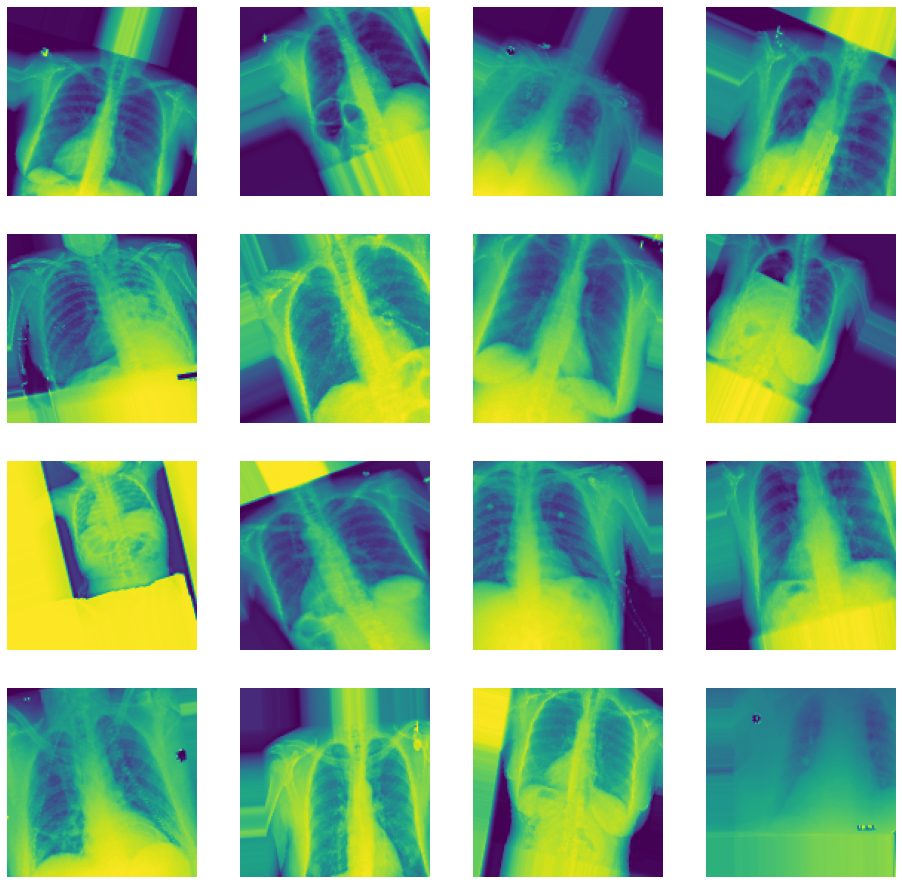

In [ ]:
t_x, t_y = next(train_flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(Card, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(train_Y)) : 
  x.append(train_Y[i]) 

for i in range(len(test_Y)) : 
  y.append(test_Y[i])   

for i in range(len(t_y)) : 
  a.append(t_y[i])   

In [ ]:
np.array(x).shape


(16, 1)

In [ ]:
np.array(y).shape

(2048, 1)

In [ ]:
np.array(a).shape

(16, 1)

In [ ]:
train_y2 = np.reshape(x, (16,1))
test_y2 = np.reshape(y, (2048,1))
t_y2 = np.reshape(a, (16,1))

## **MOBILENET** 

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(Card), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_2   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_4 (Dropout)         (None, 1024)              0         
                                                                 
 dense_4 (Dense)             (None, 512)               524800    
                                                                 
 dropout_5 (Dropout)         (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 1)                

In [ ]:
history = multi_disease_model.fit(train_X,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (t_x, t_y2), 
                                  epochs = 10)
                                  

Epoch 1/10
10/10 [==============================] - 5s 234ms/step - loss: 0.0087 - binary_accuracy: 1.0000 - mae: 0.0081 - val_loss: 0.3287 - val_binary_accuracy: 1.0000 - val_mae: 0.2802
Epoch 2/10
10/10 [==============================] - 2s 177ms/step - loss: 1.4634e-14 - binary_accuracy: 1.0000 - mae: 1.4634e-14 - val_loss: 0.0951 - val_binary_accuracy: 1.0000 - val_mae: 0.0907
Epoch 3/10
10/10 [==============================] - 2s 178ms/step - loss: 4.0598e-17 - binary_accuracy: 1.0000 - mae: 4.0598e-17 - val_loss: 0.0237 - val_binary_accuracy: 1.0000 - val_mae: 0.0234
Epoch 4/10
10/10 [==============================] - 2s 177ms/step - loss: 2.3522e-20 - binary_accuracy: 1.0000 - mae: 2.3522e-20 - val_loss: 0.0060 - val_binary_accuracy: 1.0000 - val_mae: 0.0060
Epoch 5/10
10/10 [==============================] - 2s 176ms/step - loss: 2.1795e-19 - binary_accuracy: 1.0000 - mae: 2.1795e-19 - val_loss: 0.0016 - val_binary_accuracy: 1.0000 - val_mae: 0.0016
Epoch 6/10
10/10 [==========

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[3.6301106e-05],
       [3.6301106e-05],
       [3.6301142e-05],
       ...,
       [3.6301106e-05],
       [3.6301106e-05],
       [3.6301106e-05]], dtype=float32)

In [ ]:
min(y_pred)

array([3.6301106e-05], dtype=float32)

In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.97412109375


In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.513420343311108


                 precision    recall  f1-score   support

   Cardiomegaly       0.98      0.69      0.81      1995
No Cardiomegaly       0.03      0.34      0.05        53

       accuracy                           0.68      2048
      macro avg       0.50      0.51      0.43      2048
   weighted avg       0.95      0.68      0.79      2048



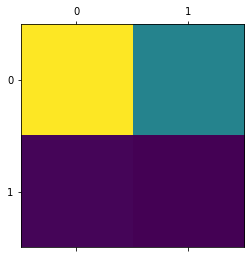

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>3.6301106e-05))
print(classification_report(test_y2, y_pred>3.6301106e-05, target_names = ['Cardiomegaly', 'No Cardiomegaly']))

## **Label- Consolidation**

In [ ]:
Con= ['Consolidation']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Con].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [0.0]
2         [0.0]
3         [0.0]
4         [0.0]
          ...  
112115    [0.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='Consolidation',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 15906 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


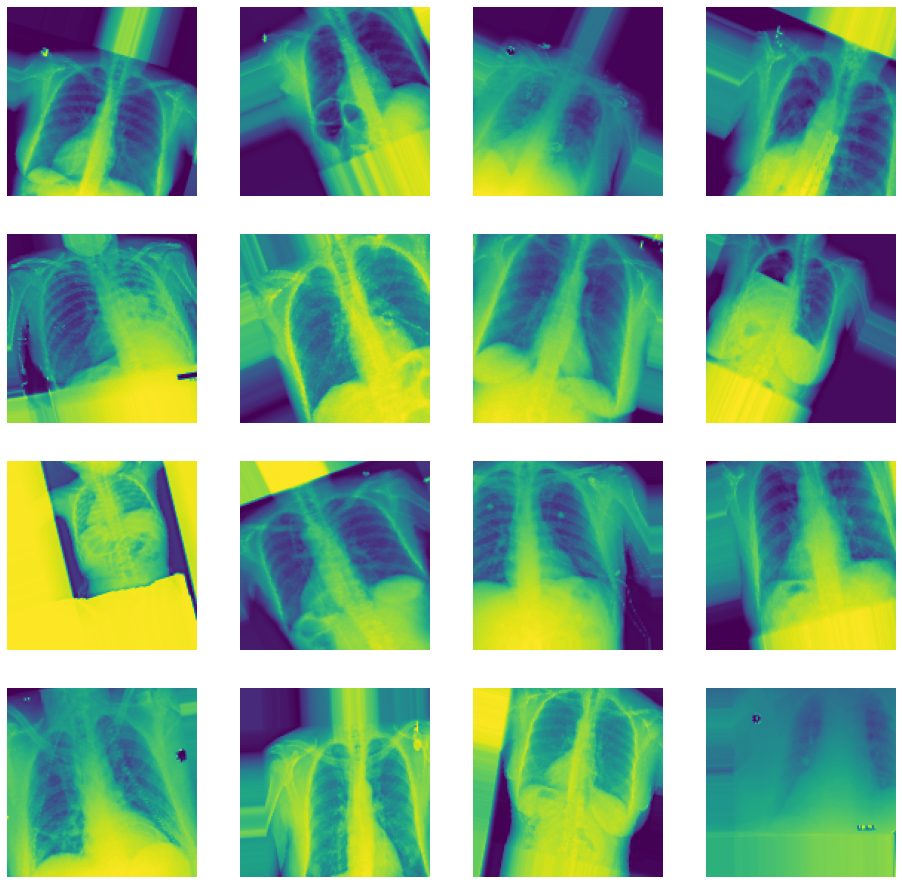

In [ ]:
t_x, t_y = next(train_flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(Con, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(train_Y)) : 
  x.append(train_Y[i]) 

for i in range(len(test_Y)) : 
  y.append(test_Y[i])   

for i in range(len(t_y)) : 
  a.append(t_y[i])   

In [ ]:
np.array(x).shape


(16, 1)

In [ ]:
np.array(y).shape

(2048, 1)

In [ ]:
np.array(a).shape

(16, 1)

In [ ]:
train_y2 = np.reshape(x, (16,1))
test_y2 = np.reshape(y, (2048,1))
t_y2 = np.reshape(a, (16,1))

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(Con), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_3   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_6 (Dropout)         (None, 1024)              0         
                                                                 
 dense_6 (Dense)             (None, 512)               524800    
                                                                 
 dropout_7 (Dropout)         (None, 512)               0         
                                                                 
 dense_7 (Dense)             (None, 1)                

In [ ]:
history = multi_disease_model.fit(train_X,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (t_x, t_y2), 
                                  epochs = 10)
                                  

Epoch 1/10
10/10 [==============================] - 5s 233ms/step - loss: 0.0268 - binary_accuracy: 1.0000 - mae: 0.0238 - val_loss: 0.3286 - val_binary_accuracy: 1.0000 - val_mae: 0.2801
Epoch 2/10
10/10 [==============================] - 2s 172ms/step - loss: 9.1108e-15 - binary_accuracy: 1.0000 - mae: 9.1108e-15 - val_loss: 0.0946 - val_binary_accuracy: 1.0000 - val_mae: 0.0902
Epoch 3/10
10/10 [==============================] - 2s 169ms/step - loss: 8.7687e-18 - binary_accuracy: 1.0000 - mae: 8.7687e-18 - val_loss: 0.0233 - val_binary_accuracy: 1.0000 - val_mae: 0.0230
Epoch 4/10
10/10 [==============================] - 2s 174ms/step - loss: 4.8308e-19 - binary_accuracy: 1.0000 - mae: 4.8308e-19 - val_loss: 0.0058 - val_binary_accuracy: 1.0000 - val_mae: 0.0058
Epoch 5/10
10/10 [==============================] - 2s 174ms/step - loss: 4.1623e-19 - binary_accuracy: 1.0000 - mae: 4.1623e-19 - val_loss: 0.0015 - val_binary_accuracy: 1.0000 - val_mae: 0.0015
Epoch 6/10
10/10 [==========

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[3.5283832e-05],
       [3.5283832e-05],
       [3.5283832e-05],
       ...,
       [3.5283832e-05],
       [3.5283832e-05],
       [3.5283800e-05]], dtype=float32)

In [ ]:
min(y_pred)

array([3.52838e-05], dtype=float32)

In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.9580078125


In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.5041248844321171


                  precision    recall  f1-score   support

   Consolidation       0.97      0.02      0.04      1962
No Consolidation       0.04      0.99      0.08        86

        accuracy                           0.06      2048
       macro avg       0.51      0.50      0.06      2048
    weighted avg       0.94      0.06      0.04      2048



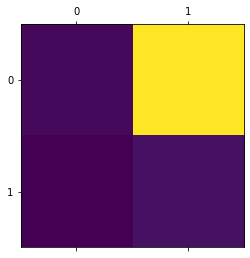

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>3.52838e-05))
print(classification_report(test_y2, y_pred>3.52838e-05, target_names = ['Consolidation', 'No Consolidation']))

## **Label- Edema**

In [ ]:
Edema= ['Edema']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Edema].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [0.0]
2         [0.0]
3         [0.0]
4         [0.0]
          ...  
112115    [0.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='Edema',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 15906 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


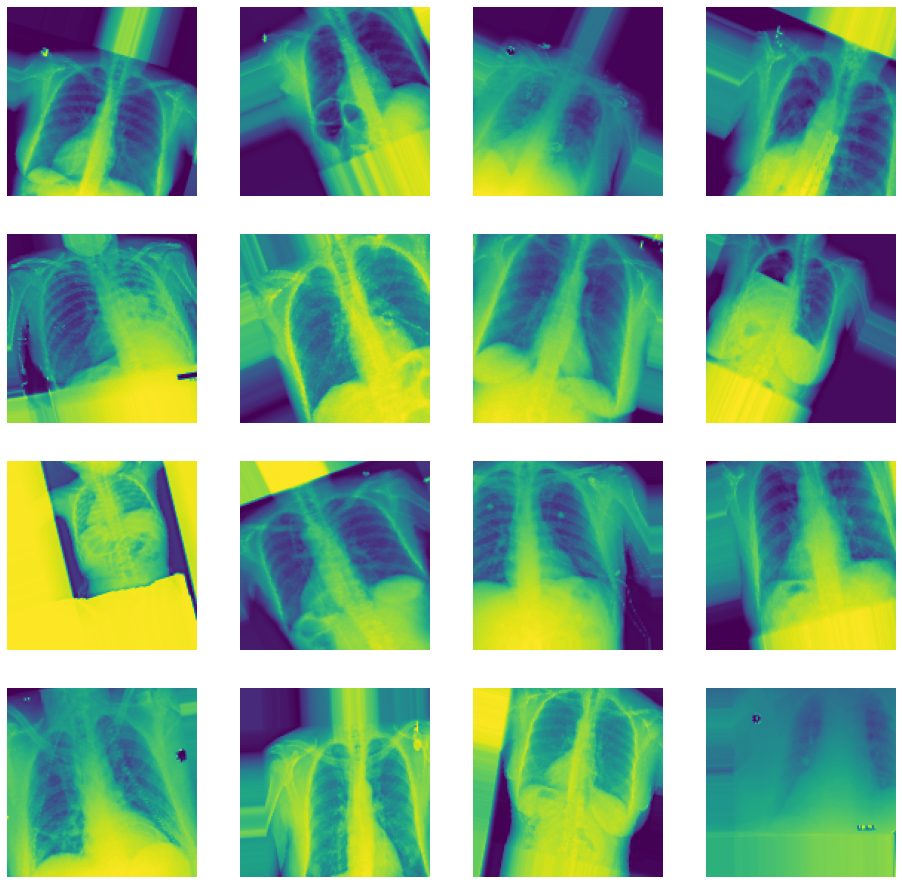

In [ ]:
t_x, t_y = next(train_flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(Edema, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(train_Y)) : 
  x.append(train_Y[i]) 

for i in range(len(test_Y)) : 
  y.append(test_Y[i])   

for i in range(len(t_y)) : 
  a.append(t_y[i])   

In [ ]:
np.array(x).shape


(16, 1)

In [ ]:
np.array(y).shape

(2048, 1)

In [ ]:
np.array(a).shape

(16, 1)

In [ ]:
train_y2 = np.reshape(x, (16,1))
test_y2 = np.reshape(y, (2048,1))
t_y2 = np.reshape(a, (16,1))

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(Edema), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_4   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_8 (Dropout)         (None, 1024)              0         
                                                                 
 dense_8 (Dense)             (None, 512)               524800    
                                                                 
 dropout_9 (Dropout)         (None, 512)               0         
                                                                 
 dense_9 (Dense)             (None, 1)                

In [ ]:
history = multi_disease_model.fit(train_X,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (t_x, t_y2), 
                                  epochs = 10)
                                  

Epoch 1/10
10/10 [==============================] - 5s 234ms/step - loss: 0.0528 - binary_accuracy: 0.9500 - mae: 0.0390 - val_loss: 0.3327 - val_binary_accuracy: 1.0000 - val_mae: 0.2830
Epoch 2/10
10/10 [==============================] - 2s 175ms/step - loss: 2.0244e-15 - binary_accuracy: 1.0000 - mae: 2.0244e-15 - val_loss: 0.0919 - val_binary_accuracy: 1.0000 - val_mae: 0.0878
Epoch 3/10
10/10 [==============================] - 2s 180ms/step - loss: 2.6558e-18 - binary_accuracy: 1.0000 - mae: 2.6558e-18 - val_loss: 0.0211 - val_binary_accuracy: 1.0000 - val_mae: 0.0209
Epoch 4/10
10/10 [==============================] - 2s 178ms/step - loss: 3.4296e-20 - binary_accuracy: 1.0000 - mae: 3.4296e-20 - val_loss: 0.0048 - val_binary_accuracy: 1.0000 - val_mae: 0.0048
Epoch 5/10
10/10 [==============================] - 2s 180ms/step - loss: 1.3059e-21 - binary_accuracy: 1.0000 - mae: 1.3059e-21 - val_loss: 0.0012 - val_binary_accuracy: 1.0000 - val_mae: 0.0012
Epoch 6/10
10/10 [==========

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[2.1467426e-05],
       [2.1467426e-05],
       [2.1467426e-05],
       ...,
       [2.1467426e-05],
       [2.1467447e-05],
       [2.1467447e-05]], dtype=float32)

In [ ]:
min(y_pred)

array([2.1467426e-05], dtype=float32)

In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.984375


In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.4650297619047619


              precision    recall  f1-score   support

       Edema       0.98      0.27      0.43      2016
    No Edema       0.01      0.66      0.03        32

    accuracy                           0.28      2048
   macro avg       0.50      0.47      0.23      2048
weighted avg       0.97      0.28      0.42      2048



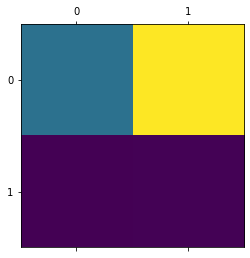

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>2.1467426e-05))
print(classification_report(test_y2, y_pred>2.1467426e-05, target_names = ['Edema', 'No Edema']))

## **Label-Effusion**

In [ ]:
Effusion= ['Effusion']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Effusion].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [0.0]
2         [1.0]
3         [0.0]
4         [0.0]
          ...  
112115    [0.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='Effusion',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 15906 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


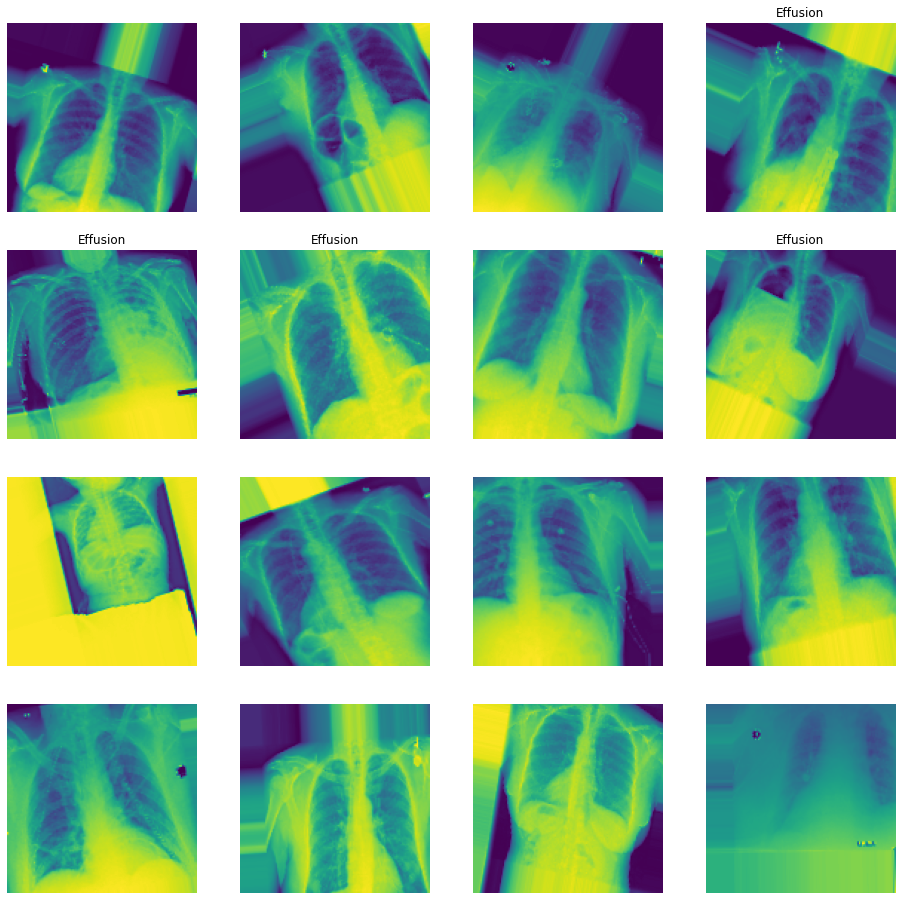

In [ ]:
t_x, t_y = next(train_flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(Effusion, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(train_Y)) : 
  x.append(train_Y[i]) 

for i in range(len(test_Y)) : 
  y.append(test_Y[i])   

for i in range(len(t_y)) : 
  a.append(t_y[i])   

In [ ]:
np.array(x).shape


(16, 1)

In [ ]:
np.array(y).shape

(2048, 1)

In [ ]:
np.array(a).shape

(16, 1)

In [ ]:
train_y2 = np.reshape(x, (16,1))
test_y2 = np.reshape(y, (2048,1))
t_y2 = np.reshape(a, (16,1))

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(Effusion), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_5   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_10 (Dropout)        (None, 1024)              0         
                                                                 
 dense_10 (Dense)            (None, 512)               524800    
                                                                 
 dropout_11 (Dropout)        (None, 512)               0         
                                                                 
 dense_11 (Dense)            (None, 1)                

In [ ]:
history = multi_disease_model.fit(train_X,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (t_x, t_y2), 
                                  epochs = 10)
                                  

Epoch 1/10
10/10 [==============================] - 5s 232ms/step - loss: 1.7219 - binary_accuracy: 0.4500 - mae: 0.5213 - val_loss: 0.6449 - val_binary_accuracy: 0.7500 - val_mae: 0.4731
Epoch 2/10
10/10 [==============================] - 2s 173ms/step - loss: 0.7894 - binary_accuracy: 0.7000 - mae: 0.2960 - val_loss: 0.6177 - val_binary_accuracy: 0.7500 - val_mae: 0.4543
Epoch 3/10
10/10 [==============================] - 2s 178ms/step - loss: 1.3038 - binary_accuracy: 0.6500 - mae: 0.4004 - val_loss: 0.6072 - val_binary_accuracy: 0.7500 - val_mae: 0.4459
Epoch 4/10
10/10 [==============================] - 2s 173ms/step - loss: 1.6612 - binary_accuracy: 0.6500 - mae: 0.3650 - val_loss: 0.5760 - val_binary_accuracy: 0.7500 - val_mae: 0.4128
Epoch 5/10
10/10 [==============================] - 2s 173ms/step - loss: 1.0224 - binary_accuracy: 0.7500 - mae: 0.2561 - val_loss: 0.5661 - val_binary_accuracy: 0.7500 - val_mae: 0.3943
Epoch 6/10
10/10 [==============================] - 2s 171ms

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[0.48836586],
       [0.4883659 ],
       [0.48836586],
       ...,
       [0.48836586],
       [0.48836583],
       [0.48836583]], dtype=float32)

In [ ]:
min(y_pred)

array([0.4883658], dtype=float32)

In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.88427734375


In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.48639234681633803


              precision    recall  f1-score   support

    Effusion       0.67      0.00      0.00      1811
 No Effusion       0.12      1.00      0.21       237

    accuracy                           0.12      2048
   macro avg       0.39      0.50      0.10      2048
weighted avg       0.60      0.12      0.03      2048



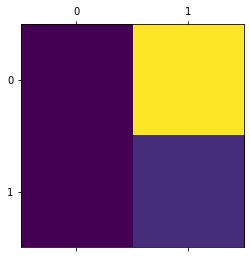

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>0.4883658))
print(classification_report(test_y2, y_pred>0.4883658, target_names = ['Effusion', 'No Effusion']))

## **Label- Emphysema**

In [ ]:
Emphysema= ['Emphysema']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Emphysema].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [1.0]
2         [0.0]
3         [0.0]
4         [0.0]
          ...  
112115    [0.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='Emphysema',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 15906 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


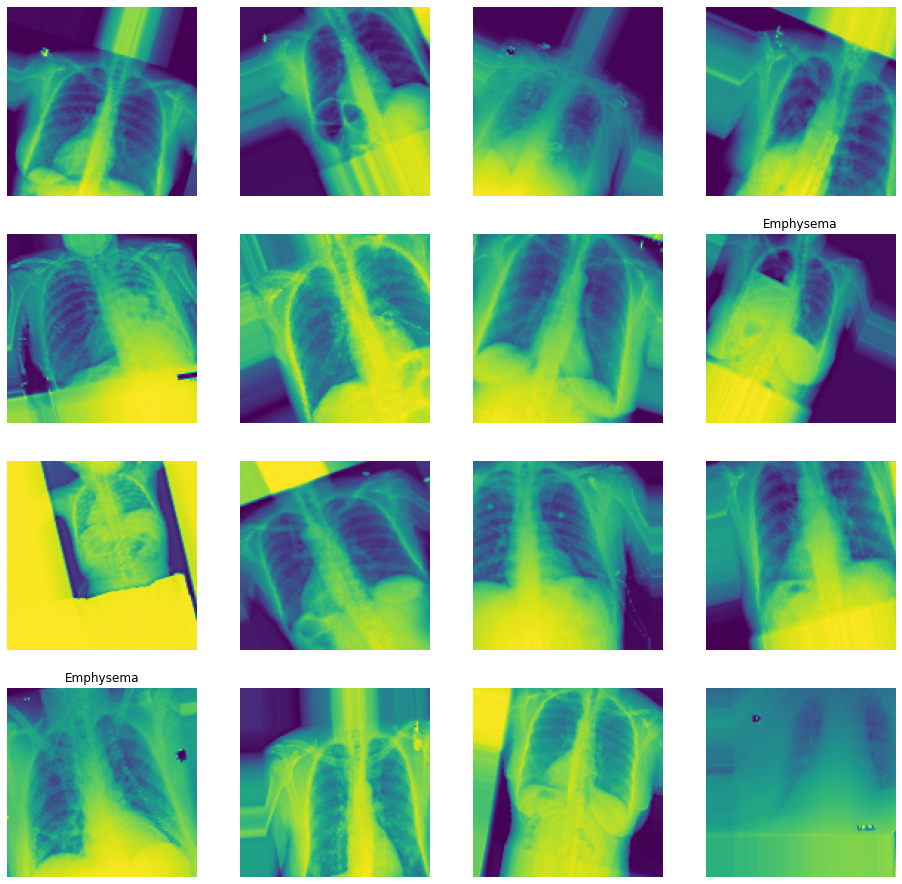

In [ ]:
t_x, t_y = next(train_flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(Emphysema, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(train_Y)) : 
  x.append(train_Y[i]) 

for i in range(len(test_Y)) : 
  y.append(test_Y[i])   

for i in range(len(t_y)) : 
  a.append(t_y[i])   

In [ ]:
np.array(x).shape


(16, 1)

In [ ]:
np.array(y).shape

(2048, 1)

In [ ]:
np.array(a).shape

(16, 1)

In [ ]:
train_y2 = np.reshape(x, (16,1))
test_y2 = np.reshape(y, (2048,1))
t_y2 = np.reshape(a, (16,1))

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(Emphysema), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_6   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_12 (Dropout)        (None, 1024)              0         
                                                                 
 dense_12 (Dense)            (None, 512)               524800    
                                                                 
 dropout_13 (Dropout)        (None, 512)               0         
                                                                 
 dense_13 (Dense)            (None, 1)                

In [ ]:
history = multi_disease_model.fit(train_X,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (t_x, t_y2), 
                                  epochs = 10)
                                  

Epoch 1/10
10/10 [==============================] - 5s 236ms/step - loss: 1.3318 - binary_accuracy: 0.9000 - mae: 0.1540 - val_loss: 0.4826 - val_binary_accuracy: 0.8750 - val_mae: 0.3672
Epoch 2/10
10/10 [==============================] - 2s 180ms/step - loss: 1.3702 - binary_accuracy: 0.9500 - mae: 0.0500 - val_loss: 0.4118 - val_binary_accuracy: 0.8750 - val_mae: 0.2967
Epoch 3/10
10/10 [==============================] - 2s 175ms/step - loss: 5.4788e-07 - binary_accuracy: 1.0000 - mae: 5.4788e-07 - val_loss: 0.3875 - val_binary_accuracy: 0.8750 - val_mae: 0.2590
Epoch 4/10
10/10 [==============================] - 2s 175ms/step - loss: 1.8175 - binary_accuracy: 0.8500 - mae: 0.1693 - val_loss: 0.4553 - val_binary_accuracy: 0.8750 - val_mae: 0.3434
Epoch 5/10
10/10 [==============================] - 2s 177ms/step - loss: 0.2315 - binary_accuracy: 0.9000 - mae: 0.1185 - val_loss: 0.3812 - val_binary_accuracy: 0.8750 - val_mae: 0.1971
Epoch 6/10
10/10 [==============================] - 

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[0.02157214],
       [0.02157214],
       [0.02157214],
       ...,
       [0.02157214],
       [0.02157214],
       [0.02157214]], dtype=float32)

In [ ]:
min(y_pred)

array([0.02157214], dtype=float32)

In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.5


In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.98095703125


              precision    recall  f1-score   support

   Emphysema       0.00      0.00      0.00      2009
No Emphysema       0.02      1.00      0.04        39

    accuracy                           0.02      2048
   macro avg       0.01      0.50      0.02      2048
weighted avg       0.00      0.02      0.00      2048



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


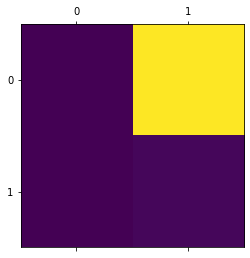

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>0.02157214))
print(classification_report(test_y2, y_pred>0.02157214, target_names = ['Emphysema', 'No Emphysema']))

## **Label- Fibrosis**

In [ ]:
Fibrosis= ['Fibrosis']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Fibrosis].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [0.0]
2         [0.0]
3         [0.0]
4         [0.0]
          ...  
112115    [0.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='Fibrosis',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 15906 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


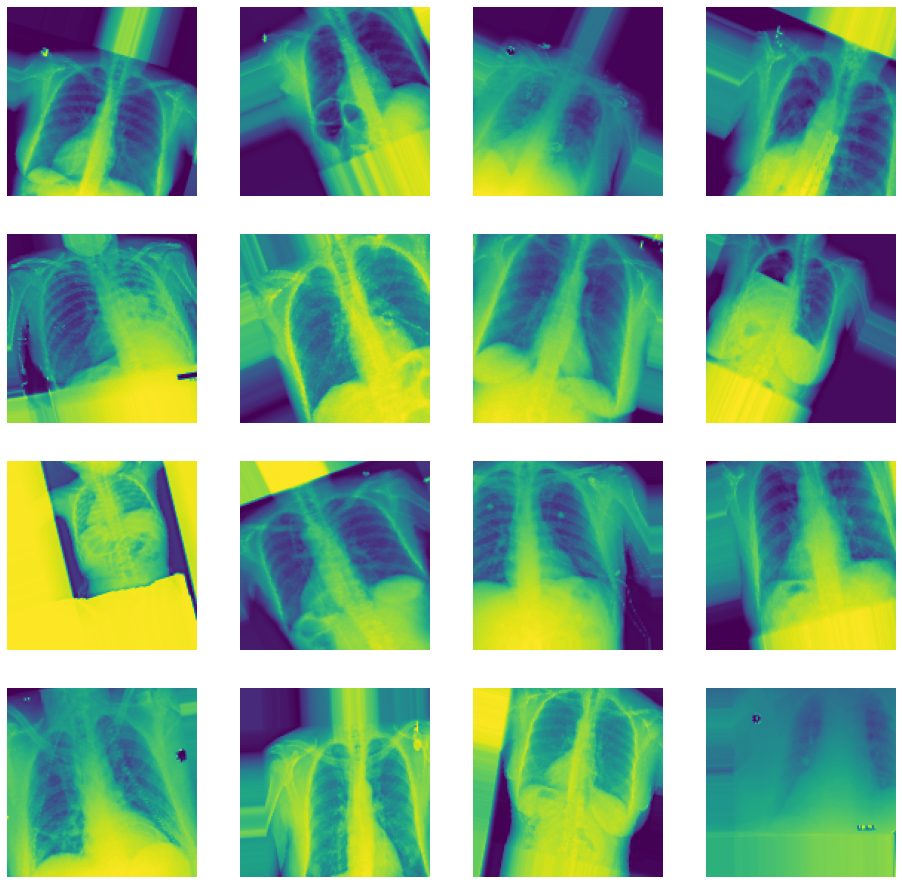

In [ ]:
t_x, t_y = next(train_flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(Fibrosis, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(train_Y)) : 
  x.append(train_Y[i]) 

for i in range(len(test_Y)) : 
  y.append(test_Y[i])   

for i in range(len(t_y)) : 
  a.append(t_y[i])   

In [ ]:
np.array(x).shape


(16, 1)

In [ ]:
np.array(y).shape

(2048, 1)

In [ ]:
np.array(a).shape

(16, 1)

In [ ]:
train_y2 = np.reshape(x, (16,1))
test_y2 = np.reshape(y, (2048,1))
t_y2 = np.reshape(a, (16,1))

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(Fibrosis), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_7   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_14 (Dropout)        (None, 1024)              0         
                                                                 
 dense_14 (Dense)            (None, 512)               524800    
                                                                 
 dropout_15 (Dropout)        (None, 512)               0         
                                                                 
 dense_15 (Dense)            (None, 1)                

In [ ]:
history = multi_disease_model.fit(train_X,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (t_x, t_y2), 
                                  epochs = 10)
                                  

Epoch 1/10
10/10 [==============================] - 5s 234ms/step - loss: 0.0107 - binary_accuracy: 1.0000 - mae: 0.0102 - val_loss: 0.3179 - val_binary_accuracy: 1.0000 - val_mae: 0.2723
Epoch 2/10
10/10 [==============================] - 2s 175ms/step - loss: 1.1789e-14 - binary_accuracy: 1.0000 - mae: 1.1789e-14 - val_loss: 0.0813 - val_binary_accuracy: 1.0000 - val_mae: 0.0780
Epoch 3/10
10/10 [==============================] - 2s 175ms/step - loss: 2.9324e-18 - binary_accuracy: 1.0000 - mae: 2.9324e-18 - val_loss: 0.0169 - val_binary_accuracy: 1.0000 - val_mae: 0.0168
Epoch 4/10
10/10 [==============================] - 2s 173ms/step - loss: 2.5892e-20 - binary_accuracy: 1.0000 - mae: 2.5892e-20 - val_loss: 0.0035 - val_binary_accuracy: 1.0000 - val_mae: 0.0035
Epoch 5/10
10/10 [==============================] - 2s 178ms/step - loss: 1.1926e-18 - binary_accuracy: 1.0000 - mae: 1.1926e-18 - val_loss: 7.7000e-04 - val_binary_accuracy: 1.0000 - val_mae: 7.6970e-04
Epoch 6/10
10/10 [==

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[1.047299e-05],
       [1.047300e-05],
       [1.047299e-05],
       ...,
       [1.047299e-05],
       [1.047300e-05],
       [1.047300e-05]], dtype=float32)

In [ ]:
min(y_pred)

array([1.047299e-05], dtype=float32)

In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.98583984375


In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.5417413878499087


              precision    recall  f1-score   support

    Fibrosis       0.99      0.50      0.66      2019
 No Fibrosis       0.02      0.59      0.03        29

    accuracy                           0.50      2048
   macro avg       0.50      0.54      0.35      2048
weighted avg       0.97      0.50      0.65      2048



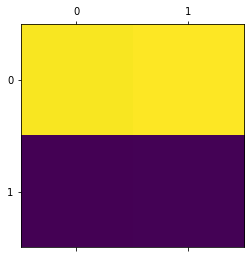

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>1.047299e-05))
print(classification_report(test_y2, y_pred>1.047299e-05, target_names = ['Fibrosis', 'No Fibrosis']))

## **Label- Hernia**

In [ ]:
Hernia= ['Hernia']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Hernia].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [0.0]
2         [0.0]
3         [0.0]
4         [1.0]
          ...  
112115    [0.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='Hernia',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 15906 validated image filenames.


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(y_train)) : 
  x.append(y_train[i]) 

for i in range(len(y_test)) : 
  y.append(y_test[i])   

In [ ]:
np.array(x).shape


(5005, 1)

In [ ]:
np.array(y).shape

(2146, 1)

In [ ]:
np.array(a).shape

(16, 1)

In [ ]:
train_y2 = np.reshape(x, (5005,1))
test_y2 = np.reshape(y, (2146,1))
#t_y2 = np.reshape(a, (16,1))

In [ ]:
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  X_train.shape[1:], 
                                 include_top = False, weights = None)
mobilenet_GAP_model = Sequential()
mobilenet_GAP_model.add(mobilenet_model)
mobilenet_GAP_model.add(GlobalAveragePooling2D())
mobilenet_GAP_model.add(Dropout(0.5))
mobilenet_GAP_model.add(Dense(512))
mobilenet_GAP_model.add(Dropout(0.5))
mobilenet_GAP_model.add(Dense(1, activation = 'sigmoid'))
mobilenet_GAP_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
mobilenet_GAP_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_2   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_4 (Dropout)         (None, 1024)              0         
                                                                 
 dense_4 (Dense)             (None, 512)               524800    
                                                                 
 dropout_5 (Dropout)         (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 1)                

In [ ]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}_weights.best.hdf5".format('xray_class')

checkpoint = ModelCheckpoint(weight_path, monitor='val_loss', verbose=1, 
                             save_best_only=True, mode='min', save_weights_only = True)

early = EarlyStopping(monitor="val_loss", 
                      mode="min", 
                      patience=3)
callbacks_list = [checkpoint, early]

In [ ]:
history_mobilenet_GAP = mobilenet_GAP_model.fit(X_train,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (X_test, test_y2), 
                                  epochs = 10, 
                                  callbacks = callbacks_list)

Epoch 1/10
10/10 [==============================] - ETA: 0s - loss: 0.1575 - binary_accuracy: 0.9313 - mae: 0.0612 
Epoch 00001: val_loss improved from inf to 0.25644, saving model to xray_class_weights.best.hdf5
10/10 [==============================] - 425s 42s/step - loss: 0.1575 - binary_accuracy: 0.9313 - mae: 0.0612 - val_loss: 0.2564 - val_binary_accuracy: 0.9986 - val_mae: 0.2256
Epoch 2/10
10/10 [==============================] - ETA: 0s - loss: 0.0452 - binary_accuracy: 0.9984 - mae: 0.0016 
Epoch 00002: val_loss improved from 0.25644 to 0.06412, saving model to xray_class_weights.best.hdf5
10/10 [==============================] - 379s 37s/step - loss: 0.0452 - binary_accuracy: 0.9984 - mae: 0.0016 - val_loss: 0.0641 - val_binary_accuracy: 0.9986 - val_mae: 0.0597
Epoch 3/10
10/10 [==============================] - ETA: 0s - loss: 0.0201 - binary_accuracy: 0.9984 - mae: 0.0016 
Epoch 00003: val_loss improved from 0.06412 to 0.03495, saving model to xray_class_weights.best.hdf5

In [ ]:
pred_Y = mobilenet_GAP_model.predict(X_test, 
                          batch_size = 32, 
                          verbose = True)

68/68 [==============================] - 35s 503ms/step


In [ ]:
pred_Y

array([[0.0044266],
       [0.0044266],
       [0.0044266],
       ...,
       [0.0044266],
       [0.0044266],
       [0.0044266]], dtype=float32)

In [ ]:
min(pred_Y)

array([0.0044266], dtype=float32)

In [ ]:
print('test accuracy = ',mobilenet_GAP_model.evaluate(X_test,test_y2, verbose=0)[1])

test accuracy =  0.998602032661438


In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), pred_Y))

roc score =  0.5


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

   No Hernia       1.00      1.00      1.00      2143
      Hernia       0.00      0.00      0.00         3

    accuracy                           1.00      2146
   macro avg       0.50      0.50      0.50      2146
weighted avg       1.00      1.00      1.00      2146



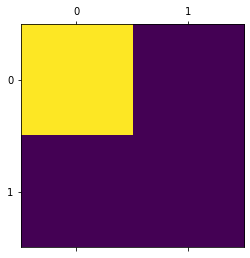

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, pred_Y>0.0044266))
print(classification_report(test_y2, pred_Y>0.0044266, target_names = ['No Hernia', 'Hernia']))

## **Label- Infiltration**

In [ ]:
Infiltration= ['Infiltration']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Infiltration].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [0.0]
2         [0.0]
3         [0.0]
4         [0.0]
          ...  
112115    [0.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='Infiltration',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 15906 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


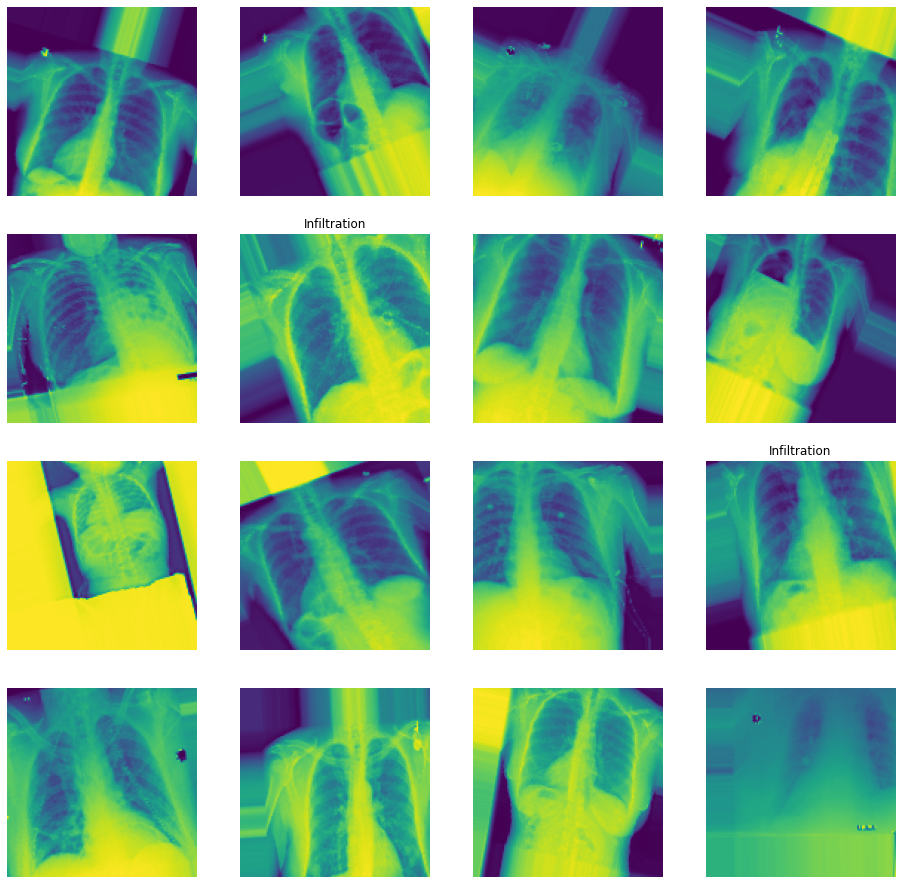

In [ ]:
t_x, t_y = next(train_flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(Infiltration, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(train_Y)) : 
  x.append(train_Y[i]) 

for i in range(len(test_Y)) : 
  y.append(test_Y[i])   

for i in range(len(t_y)) : 
  a.append(t_y[i])   

In [ ]:
np.array(x).shape


(16, 1)

In [ ]:
np.array(y).shape

(2048, 1)

In [ ]:
np.array(a).shape

(16, 1)

In [ ]:
train_y2 = np.reshape(x, (16,1))
test_y2 = np.reshape(y, (2048,1))
t_y2 = np.reshape(a, (16,1))

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(Infiltration), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_9   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_18 (Dropout)        (None, 1024)              0         
                                                                 
 dense_18 (Dense)            (None, 512)               524800    
                                                                 
 dropout_19 (Dropout)        (None, 512)               0         
                                                                 
 dense_19 (Dense)            (None, 1)                

In [ ]:
history = multi_disease_model.fit(train_X,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (t_x, t_y2), 
                                  epochs = 10)
                                  

Epoch 1/10
10/10 [==============================] - 5s 234ms/step - loss: 3.1688 - binary_accuracy: 0.6500 - mae: 0.3447 - val_loss: 0.6371 - val_binary_accuracy: 0.8750 - val_mae: 0.4705
Epoch 2/10
10/10 [==============================] - 2s 175ms/step - loss: 0.5570 - binary_accuracy: 0.7500 - mae: 0.3283 - val_loss: 0.6626 - val_binary_accuracy: 0.8750 - val_mae: 0.4843
Epoch 3/10
10/10 [==============================] - 2s 182ms/step - loss: 1.4669 - binary_accuracy: 0.6000 - mae: 0.3912 - val_loss: 0.6374 - val_binary_accuracy: 0.8750 - val_mae: 0.4706
Epoch 4/10
10/10 [==============================] - 2s 181ms/step - loss: 0.6682 - binary_accuracy: 0.6500 - mae: 0.3361 - val_loss: 0.5612 - val_binary_accuracy: 0.8750 - val_mae: 0.4248
Epoch 5/10
10/10 [==============================] - 2s 181ms/step - loss: 2.0557 - binary_accuracy: 0.5500 - mae: 0.4524 - val_loss: 0.4488 - val_binary_accuracy: 0.8750 - val_mae: 0.3372
Epoch 6/10
10/10 [==============================] - 2s 176ms

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[0.15012267],
       [0.1501227 ],
       [0.15012267],
       ...,
       [0.1501227 ],
       [0.15012267],
       [0.15012267]], dtype=float32)

In [ ]:
min(y_pred)

array([0.15012267], dtype=float32)

In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.82275390625


In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.501625099116332


                 precision    recall  f1-score   support

   Infiltration       0.82      0.54      0.65      1685
No Infiltration       0.18      0.47      0.26       363

       accuracy                           0.52      2048
      macro avg       0.50      0.50      0.45      2048
   weighted avg       0.71      0.52      0.58      2048



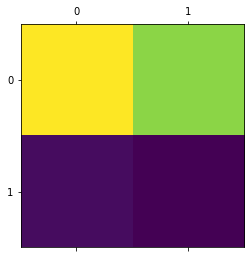

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>0.15012267))
print(classification_report(test_y2, y_pred>0.15012267, target_names = ['Infiltration', 'No Infiltration']))

## **Label- Mass**

In [ ]:
Mass= ['Mass']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Mass].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [0.0]
2         [0.0]
3         [0.0]
4         [0.0]
          ...  
112115    [1.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='Mass',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 15906 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


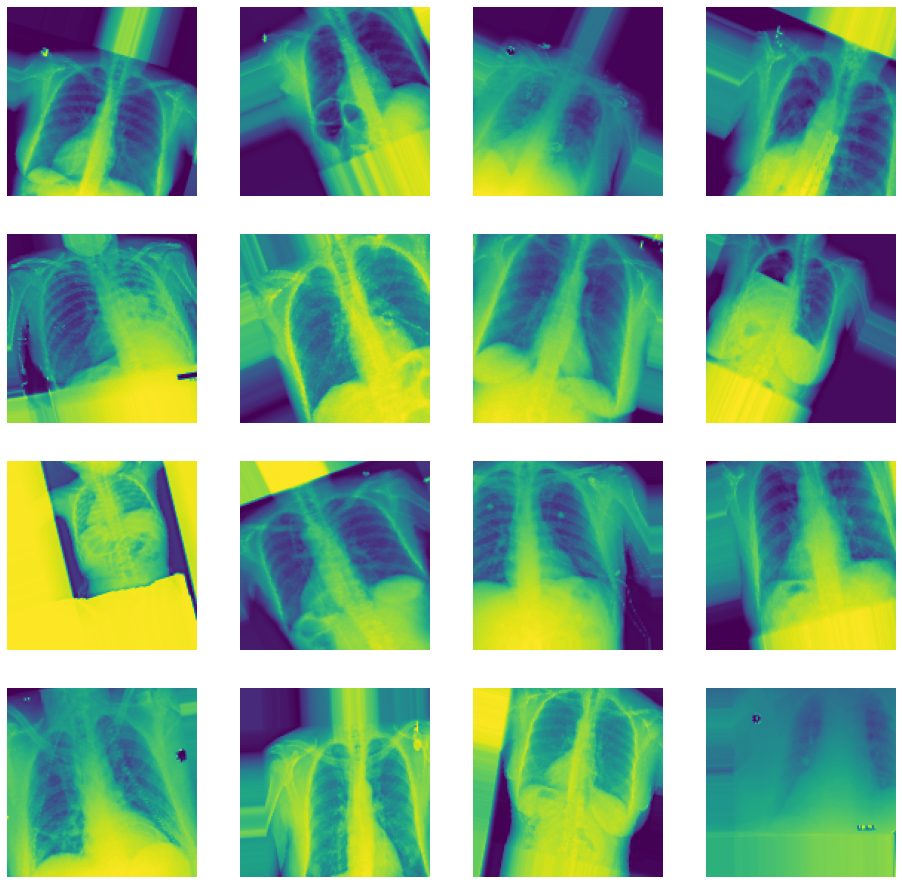

In [ ]:
t_x, t_y = next(train_flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(Mass, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(train_Y)) : 
  x.append(train_Y[i]) 

for i in range(len(test_Y)) : 
  y.append(test_Y[i])   

for i in range(len(t_y)) : 
  a.append(t_y[i])   

In [ ]:
np.array(x).shape


(16, 1)

In [ ]:
np.array(y).shape

(2048, 1)

In [ ]:
np.array(a).shape

(16, 1)

In [ ]:
train_y2 = np.reshape(x, (16,1))
test_y2 = np.reshape(y, (2048,1))
t_y2 = np.reshape(a, (16,1))

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(Mass), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_10  (None, 1024)             0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_20 (Dropout)        (None, 1024)              0         
                                                                 
 dense_20 (Dense)            (None, 512)               524800    
                                                                 
 dropout_21 (Dropout)        (None, 512)               0         
                                                                 
 dense_21 (Dense)            (None, 1)               

In [ ]:
history = multi_disease_model.fit(train_X,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (t_x, t_y2), 
                                  epochs = 10)
                                  

Epoch 1/10
10/10 [==============================] - 5s 243ms/step - loss: 0.0402 - binary_accuracy: 1.0000 - mae: 0.0329 - val_loss: 0.3206 - val_binary_accuracy: 1.0000 - val_mae: 0.2743
Epoch 2/10
10/10 [==============================] - 2s 183ms/step - loss: 4.5531e-16 - binary_accuracy: 1.0000 - mae: 4.5531e-16 - val_loss: 0.0839 - val_binary_accuracy: 1.0000 - val_mae: 0.0805
Epoch 3/10
10/10 [==============================] - 2s 177ms/step - loss: 6.3145e-18 - binary_accuracy: 1.0000 - mae: 6.3145e-18 - val_loss: 0.0184 - val_binary_accuracy: 1.0000 - val_mae: 0.0182
Epoch 4/10
10/10 [==============================] - 2s 176ms/step - loss: 1.5389e-19 - binary_accuracy: 1.0000 - mae: 1.5389e-19 - val_loss: 0.0041 - val_binary_accuracy: 1.0000 - val_mae: 0.0041
Epoch 5/10
10/10 [==============================] - 2s 176ms/step - loss: 1.2216e-20 - binary_accuracy: 1.0000 - mae: 1.2216e-20 - val_loss: 9.6211e-04 - val_binary_accuracy: 1.0000 - val_mae: 9.6163e-04
Epoch 6/10
10/10 [==

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[1.614412e-05],
       [1.614412e-05],
       [1.614412e-05],
       ...,
       [1.614412e-05],
       [1.614412e-05],
       [1.614412e-05]], dtype=float32)

In [ ]:
min(y_pred)

array([1.614412e-05], dtype=float32)

In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.951171875


In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.5034599589322382


              precision    recall  f1-score   support

        Mass       0.95      1.00      0.97      1948
     No Mass       0.14      0.01      0.02       100

    accuracy                           0.95      2048
   macro avg       0.55      0.50      0.50      2048
weighted avg       0.91      0.95      0.93      2048



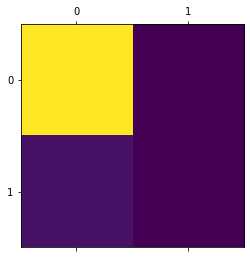

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>1.614412e-05))
print(classification_report(test_y2, y_pred>1.614412e-05, target_names = ['Mass', 'No Mass']))

## **Label- Nodule**

In [ ]:
Nodule= ['Nodule']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Nodule].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [0.0]
2         [0.0]
3         [0.0]
4         [0.0]
          ...  
112115    [0.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='Nodule',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 15906 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


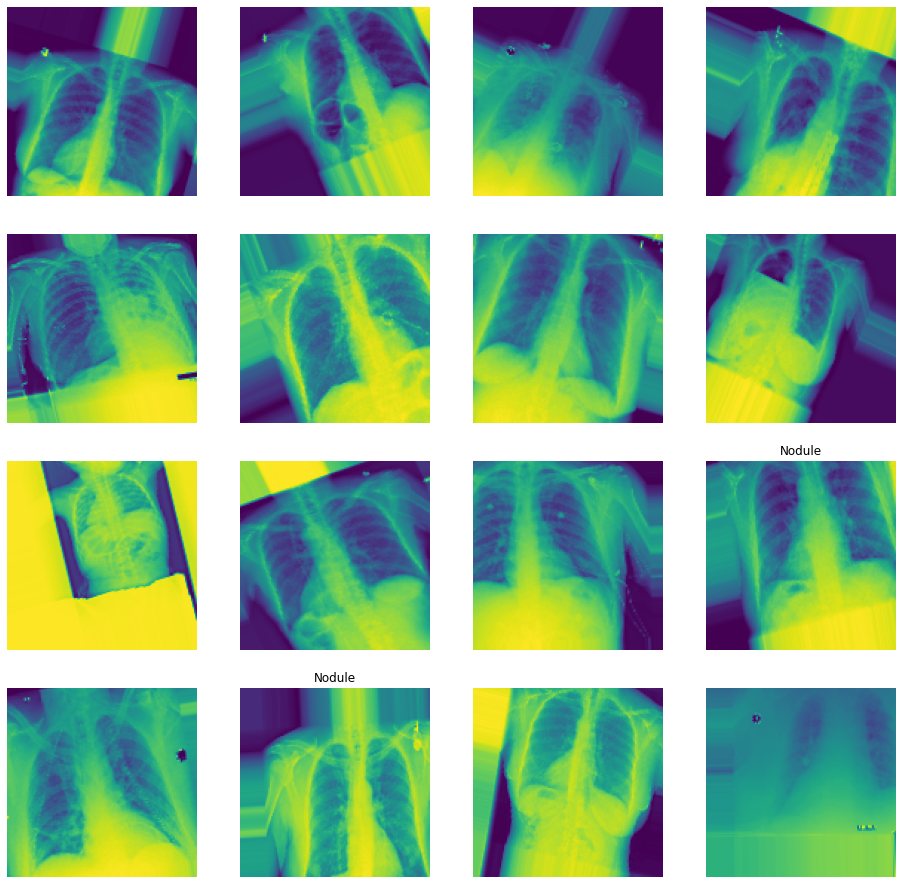

In [ ]:
t_x, t_y = next(train_flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(Nodule, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(train_Y)) : 
  x.append(train_Y[i]) 

for i in range(len(test_Y)) : 
  y.append(test_Y[i])   

for i in range(len(t_y)) : 
  a.append(t_y[i])   

In [ ]:
np.array(x).shape


(16, 1)

In [ ]:
np.array(y).shape

(2048, 1)

In [ ]:
np.array(a).shape

(16, 1)

In [ ]:
train_y2 = np.reshape(x, (16,1))
test_y2 = np.reshape(y, (2048,1))
t_y2 = np.reshape(a, (16,1))

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(Nodule), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_11  (None, 1024)             0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_22 (Dropout)        (None, 1024)              0         
                                                                 
 dense_22 (Dense)            (None, 512)               524800    
                                                                 
 dropout_23 (Dropout)        (None, 512)               0         
                                                                 
 dense_23 (Dense)            (None, 1)               

In [ ]:
history = multi_disease_model.fit(train_X,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (t_x, t_y2), 
                                  epochs = 10)
                                  

Epoch 1/10
10/10 [==============================] - 5s 237ms/step - loss: 0.6158 - binary_accuracy: 0.9000 - mae: 0.1070 - val_loss: 0.5130 - val_binary_accuracy: 0.8750 - val_mae: 0.3912
Epoch 2/10
10/10 [==============================] - 2s 176ms/step - loss: 1.7503 - binary_accuracy: 0.9000 - mae: 0.1000 - val_loss: 0.4568 - val_binary_accuracy: 0.8750 - val_mae: 0.3447
Epoch 3/10
10/10 [==============================] - 2s 178ms/step - loss: 0.0042 - binary_accuracy: 1.0000 - mae: 0.0041 - val_loss: 0.4621 - val_binary_accuracy: 0.8750 - val_mae: 0.3496
Epoch 4/10
10/10 [==============================] - 2s 173ms/step - loss: 1.2696 - binary_accuracy: 0.9000 - mae: 0.1445 - val_loss: 0.5493 - val_binary_accuracy: 0.8750 - val_mae: 0.4169
Epoch 5/10
10/10 [==============================] - 2s 173ms/step - loss: 0.3117 - binary_accuracy: 0.8500 - mae: 0.1456 - val_loss: 0.4038 - val_binary_accuracy: 0.8750 - val_mae: 0.2860
Epoch 6/10
10/10 [==============================] - 2s 176ms

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[0.09439716],
       [0.09439716],
       [0.09439716],
       ...,
       [0.09439716],
       [0.09439713],
       [0.09439713]], dtype=float32)

In [ ]:
min(y_pred)

array([0.09439713], dtype=float32)

In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.94287109375


In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.5016753199042168


              precision    recall  f1-score   support

      Nodule       0.95      0.06      0.12      1931
   No Nodule       0.06      0.94      0.11       117

    accuracy                           0.11      2048
   macro avg       0.50      0.50      0.11      2048
weighted avg       0.89      0.11      0.12      2048



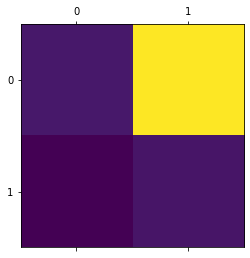

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>0.09439713))
print(classification_report(test_y2, y_pred>0.09439713, target_names = ['Nodule', 'No Nodule']))

## **Label- Pleural-thickening**

In [ ]:
Pl_T= ['Pleural_Thickening']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Pl_T].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [0.0]
2         [0.0]
3         [0.0]
4         [0.0]
          ...  
112115    [0.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='target_vector',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 112120 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


In [ ]:
t_x, t_y = next(flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(Pl_T, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


KeyboardInterrupt: ignored

In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(y_train)) : 
  x.append(y_train[i]) 

for i in range(len(y_test)) : 
  y.append(y_test[i])   

# for i in range(len(t_y)) : 
#   a.append(t_y[i])   

In [ ]:
np.array(x).shape


(10010, 1)

In [ ]:
np.array(y).shape

(4292, 1)

In [ ]:
np.array(a).shape

In [ ]:
X_train.shape

(5005, 128, 128, 1)

In [ ]:
train_y2 = np.reshape(x, (5005,1))
test_y2 = np.reshape(y, (4292,1))
#t_y2 = np.reshape(a, (16,1))

ValueError: ignored

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  X_train.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(Pl_T), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d (G  (None, 1024)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense (Dense)               (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 1)                 5

In [ ]:
history = multi_disease_model.fit(X_train,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (X_test, test_y2), 
                                  epochs = 10)
                                  

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[4.291682e-05],
       [4.291682e-05],
       [4.291682e-05],
       ...,
       [4.291682e-05],
       [4.291682e-05],
       [4.291682e-05]], dtype=float32)

In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.97021484375


In [ ]:
min(y_pred)

array([4.291682e-05], dtype=float32)

In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.5


                       precision    recall  f1-score   support

   Pleural_Thickening       0.97      1.00      0.98      1987
No Pleural_Thickening       0.00      0.00      0.00        61

             accuracy                           0.97      2048
            macro avg       0.49      0.50      0.49      2048
         weighted avg       0.94      0.97      0.96      2048



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


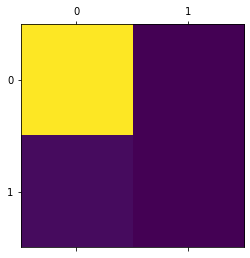

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>4.291682e-05))
print(classification_report(test_y2, y_pred>4.291682e-05, target_names = ['Pleural_Thickening', 'No Pleural_Thickening']))

## **Label- Pneumonia**

In [ ]:
Pneu= ['Pneumonia']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Pneu].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [0.0]
2         [0.0]
3         [0.0]
4         [0.0]
          ...  
112115    [1.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='path', y_col='target_vector',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 15906 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


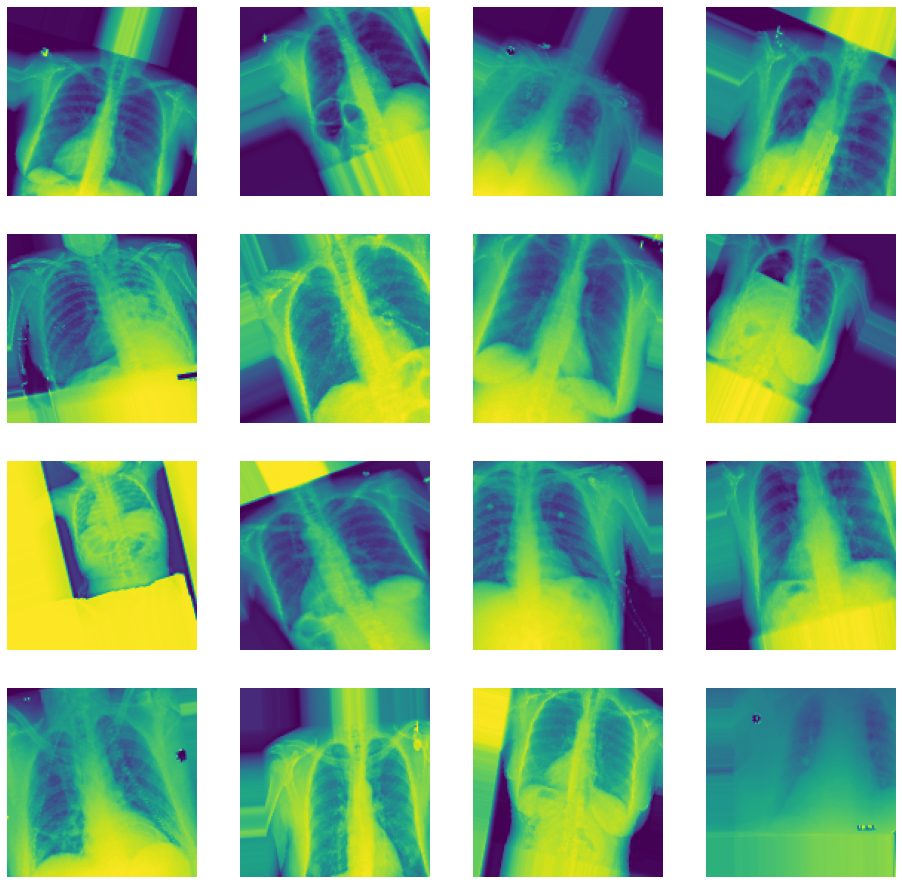

In [ ]:
t_x, t_y = next(flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(Pneu, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(train_Y)) : 
  x.append(train_Y[i]) 

for i in range(len(test_Y)) : 
  y.append(test_Y[i])   

for i in range(len(t_y)) : 
  a.append(t_y[i])   

In [ ]:
np.array(x).shape


(16, 1)

In [ ]:
np.array(y).shape

(2048, 1)

In [ ]:
np.array(a).shape

(16, 1)

In [ ]:
train_y2 = np.reshape(x, (16,1))
test_y2 = np.reshape(y, (2048,1))
t_y2 = np.reshape(a, (16,1))

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(Pneu), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_13  (None, 1024)             0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_26 (Dropout)        (None, 1024)              0         
                                                                 
 dense_26 (Dense)            (None, 512)               524800    
                                                                 
 dropout_27 (Dropout)        (None, 512)               0         
                                                                 
 dense_27 (Dense)            (None, 1)               

In [ ]:
history = multi_disease_model.fit(train_X,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (t_x, t_y2), 
                                  epochs = 10)
                                  

Epoch 1/10
10/10 [==============================] - 5s 240ms/step - loss: 0.0574 - binary_accuracy: 0.9500 - mae: 0.0389 - val_loss: 0.3662 - val_binary_accuracy: 1.0000 - val_mae: 0.3066
Epoch 2/10
10/10 [==============================] - 2s 181ms/step - loss: 5.6866e-15 - binary_accuracy: 1.0000 - mae: 5.6866e-15 - val_loss: 0.1266 - val_binary_accuracy: 1.0000 - val_mae: 0.1189
Epoch 3/10
10/10 [==============================] - 2s 179ms/step - loss: 2.1227e-18 - binary_accuracy: 1.0000 - mae: 2.1227e-18 - val_loss: 0.0384 - val_binary_accuracy: 1.0000 - val_mae: 0.0376
Epoch 4/10
10/10 [==============================] - 2s 179ms/step - loss: 1.1862e-18 - binary_accuracy: 1.0000 - mae: 1.1862e-18 - val_loss: 0.0118 - val_binary_accuracy: 1.0000 - val_mae: 0.0117
Epoch 5/10
10/10 [==============================] - 2s 178ms/step - loss: 1.3378e-18 - binary_accuracy: 1.0000 - mae: 1.3378e-18 - val_loss: 0.0038 - val_binary_accuracy: 1.0000 - val_mae: 0.0038
Epoch 6/10
10/10 [==========

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[0.00014827],
       [0.00014827],
       [0.00014827],
       ...,
       [0.00014827],
       [0.00014827],
       [0.00014827]], dtype=float32)

In [ ]:
min(y_pred)

array([0.00014827], dtype=float32)

In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.98828125


In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.5


              precision    recall  f1-score   support

   Pneumonia       0.99      1.00      0.99      2024
No Pneumonia       0.00      0.00      0.00        24

    accuracy                           0.99      2048
   macro avg       0.49      0.50      0.50      2048
weighted avg       0.98      0.99      0.98      2048



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


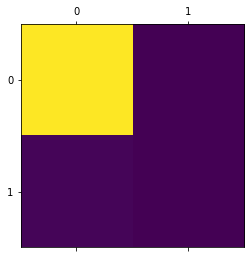

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>0.00014827))
print(classification_report(test_y2, y_pred>0.00014827, target_names = ['Pneumonia', 'No Pneumonia']))

## **Label- Pneumothorax**

In [ ]:
Pneumothorax= ['Pneumothorax']
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[Pneumothorax].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0]
1         [0.0]
2         [0.0]
3         [0.0]
4         [0.0]
          ...  
112115    [0.0]
112116    [0.0]
112117    [0.0]
112118    [0.0]
112119    [0.0]
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)


In [ ]:
SEED= 10
IMG_SIZE = (128, 128) 
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='path', y_col='Pneumothorax',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    
        
    while True:
        X1i = gen_img.next()
        yield [X1i[0], X1i[1]]

In [ ]:
flow = flow_from_dataframe(idg, all_xray_df, 7151, SEED, IMG_SIZE)

In [ ]:
t,y= next(flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 15906 validated image filenames.


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(t,y, 
                                   test_size = 0.30, 
                                   random_state = 2018)


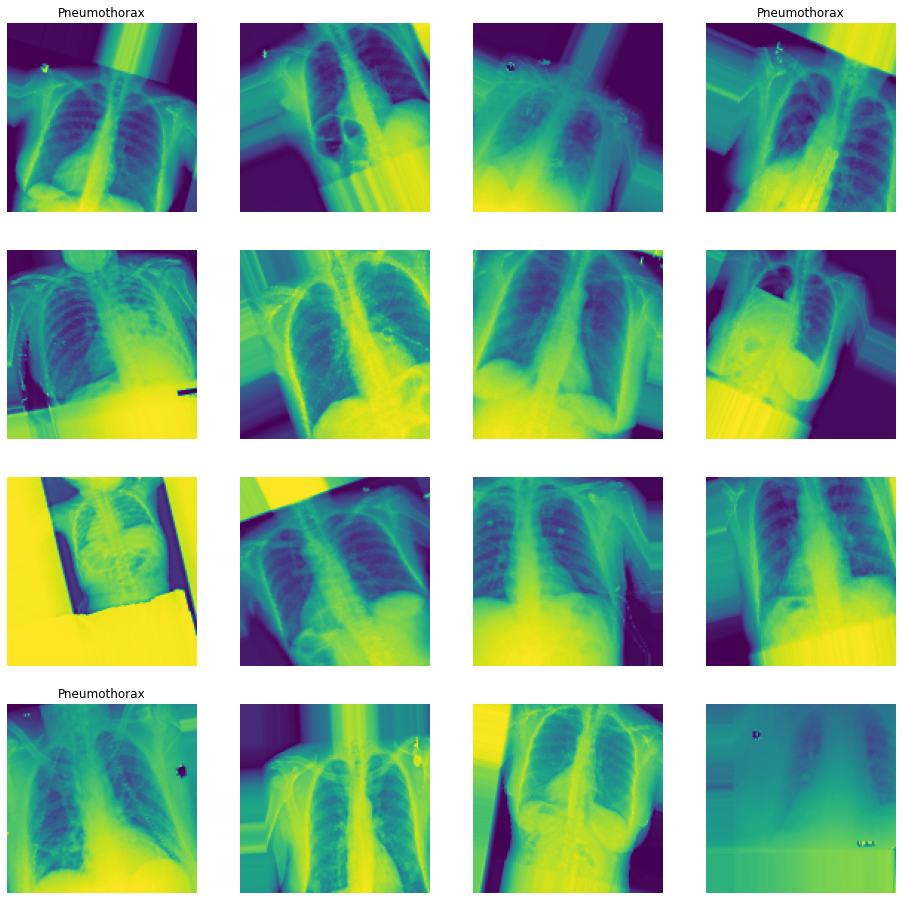

In [ ]:
t_x, t_y = next(train_flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(Pneumothorax, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(train_Y)) : 
  x.append(train_Y[i]) 

for i in range(len(test_Y)) : 
  y.append(test_Y[i])   

for i in range(len(t_y)) : 
  a.append(t_y[i])   

In [ ]:
np.array(x).shape


(16, 1)

In [ ]:
np.array(y).shape

(2048, 1)

In [ ]:
np.array(a).shape

(16, 1)

In [ ]:
train_y2 = np.reshape(x, (16,1))
test_y2 = np.reshape(y, (2048,1))
t_y2 = np.reshape(a, (16,1))

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(Pneumothorax), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_14  (None, 1024)             0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_28 (Dropout)        (None, 1024)              0         
                                                                 
 dense_28 (Dense)            (None, 512)               524800    
                                                                 
 dropout_29 (Dropout)        (None, 512)               0         
                                                                 
 dense_29 (Dense)            (None, 1)               

In [ ]:
history = multi_disease_model.fit(train_X,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (t_x, t_y2), 
                                  epochs = 10)
                                  

Epoch 1/10
10/10 [==============================] - 5s 238ms/step - loss: 2.3689 - binary_accuracy: 0.8500 - mae: 0.1504 - val_loss: 0.5694 - val_binary_accuracy: 0.8125 - val_mae: 0.4246
Epoch 2/10
10/10 [==============================] - 2s 178ms/step - loss: 1.5479 - binary_accuracy: 0.8500 - mae: 0.1439 - val_loss: 0.6701 - val_binary_accuracy: 0.8125 - val_mae: 0.4881
Epoch 3/10
10/10 [==============================] - 2s 175ms/step - loss: 1.1654 - binary_accuracy: 0.6500 - mae: 0.3407 - val_loss: 0.6708 - val_binary_accuracy: 0.8125 - val_mae: 0.4885
Epoch 4/10
10/10 [==============================] - 2s 177ms/step - loss: 0.2805 - binary_accuracy: 0.9000 - mae: 0.1450 - val_loss: 0.6433 - val_binary_accuracy: 0.8125 - val_mae: 0.4733
Epoch 5/10
10/10 [==============================] - 2s 179ms/step - loss: 0.8831 - binary_accuracy: 0.8500 - mae: 0.1781 - val_loss: 0.6654 - val_binary_accuracy: 0.8125 - val_mae: 0.4856
Epoch 6/10
10/10 [==============================] - 2s 176ms

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[0.0847553],
       [0.0847553],
       [0.0847553],
       ...,
       [0.0847553],
       [0.0847553],
       [0.0847553]], dtype=float32)

In [ ]:
min(y_pred)

array([0.0847553], dtype=float32)

In [ ]:
from sklearn.metrics import roc_auc_score
print('roc score = ',roc_auc_score(test_y2.astype(int), y_pred))

roc score =  0.5


In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.95263671875


                 precision    recall  f1-score   support

   Pneumothorax       0.95      1.00      0.98      1951
No Pneumothorax       0.00      0.00      0.00        97

       accuracy                           0.95      2048
      macro avg       0.48      0.50      0.49      2048
   weighted avg       0.91      0.95      0.93      2048



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


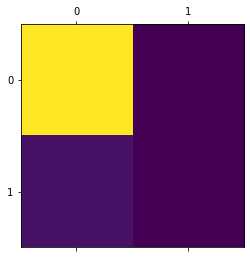

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
plt.matshow(confusion_matrix(test_y2, y_pred>0.0847553))
print(classification_report(test_y2, y_pred>0.0847553, target_names = ['Pneumothorax', 'No Pneumothorax']))

## **ALL LABELS minus "NO Findings"**

In [ ]:
## MODEL CREATION PHASE STARTS HERE

# create vector as ground-truth, will use as actuals to compare against our predictions later
all_xray_df['target_vector'] = all_xray_df.apply(lambda target: [target[pathology_list].values], 1).map(lambda target: target[0])

In [ ]:
all_xray_df['target_vector']=all_xray_df.apply(lambda target: np.asarray(target['target_vector']).astype(np.float32), 1)

In [ ]:
all_xray_df['target_vector']

0         [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1         [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
2         [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
3         [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
4         [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
                                ...                        
112115    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, ...
112116    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
112117    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
112118    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
112119    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
Name: target_vector, Length: 112120, dtype: object

In [ ]:
# split the data into a training and testing set
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(all_xray_df, test_size = 0.2, random_state = 1993)

# quick check to see that the training and test set were split properly
print('training set - # of observations: ', len(train_set))
print('test set - # of observations): ', len(test_set))
print('prior, full data set - # of observations): ', len(all_xray_df))

training set - # of observations:  89696
test set - # of observations):  22424
prior, full data set - # of observations):  112120


In [ ]:
IMG_SIZE= (128,128)
SEED= 10

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
train_idg = ImageDataGenerator(zoom_range=0.2,
                           fill_mode='nearest',
                           rotation_range=25,  
                           width_shift_range=0.25,  
                           height_shift_range=0.25,  
                           vertical_flip=False, 
                           horizontal_flip=True,
                           shear_range = 0.2,
                           samplewise_center=False, 
                           samplewise_std_normalization=False)

val_idg = ImageDataGenerator(width_shift_range=0.25, 
                         height_shift_range=0.25, 
                         horizontal_flip=True)

test_idg = ImageDataGenerator()


In [ ]:
####
def flow_from_dataframe(imgDatGen, df, batch_size, seed, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='target_vector',
        batch_size=batch_size, seed=seed, shuffle=True, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

    

    while True:
        X1i = gen_img.next()
       # X2i = gen_gender.next()
        #gc.collect()
        yield [X1i[0],X1i[1]] 

####

train_flow = flow_from_dataframe(train_idg, train_set, 16, SEED, IMG_SIZE)

valid_flow = flow_from_dataframe(val_idg, test_set, 128, SEED, IMG_SIZE)

####


def test_gen_2inputs(imgDatGen, df, batch_size, img_size):
    #gc.collect()
    gen_img = imgDatGen.flow_from_dataframe(dataframe=df,
        x_col='full_path', y_col='target_vector',
        batch_size=2048, shuffle=False, class_mode='other',
        target_size=img_size, color_mode='grayscale',
        drop_duplicates=False)

  
    while True:
        X1i = gen_img.next()
        #X2i = gen_gender.next()
        #gc.collect()
        yield [X1i[0],X1i[1]] 

test_flow = test_gen_2inputs(test_idg, test_set, 789, IMG_SIZE)


In [ ]:
train_X, train_Y = next(train_flow)
test_X, test_Y = next(test_flow)

--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 89696 validated image filenames.


--- Logging error ---
Traceback (most recent call last):
  File "/usr/lib/python3.7/logging/__init__.py", line 1025, in emit
    msg = self.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 869, in format
    return fmt.format(record)
  File "/usr/lib/python3.7/logging/__init__.py", line 608, in format
    record.message = record.getMessage()
  File "/usr/lib/python3.7/logging/__init__.py", line 369, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/usr/lib/python3.7/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.7/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.7/dist-packages/traitlets/config/application.py", line 846, in launch_instance
    app.start()
  File "/usr/local/lib/pytho

Found 22424 validated image filenames.


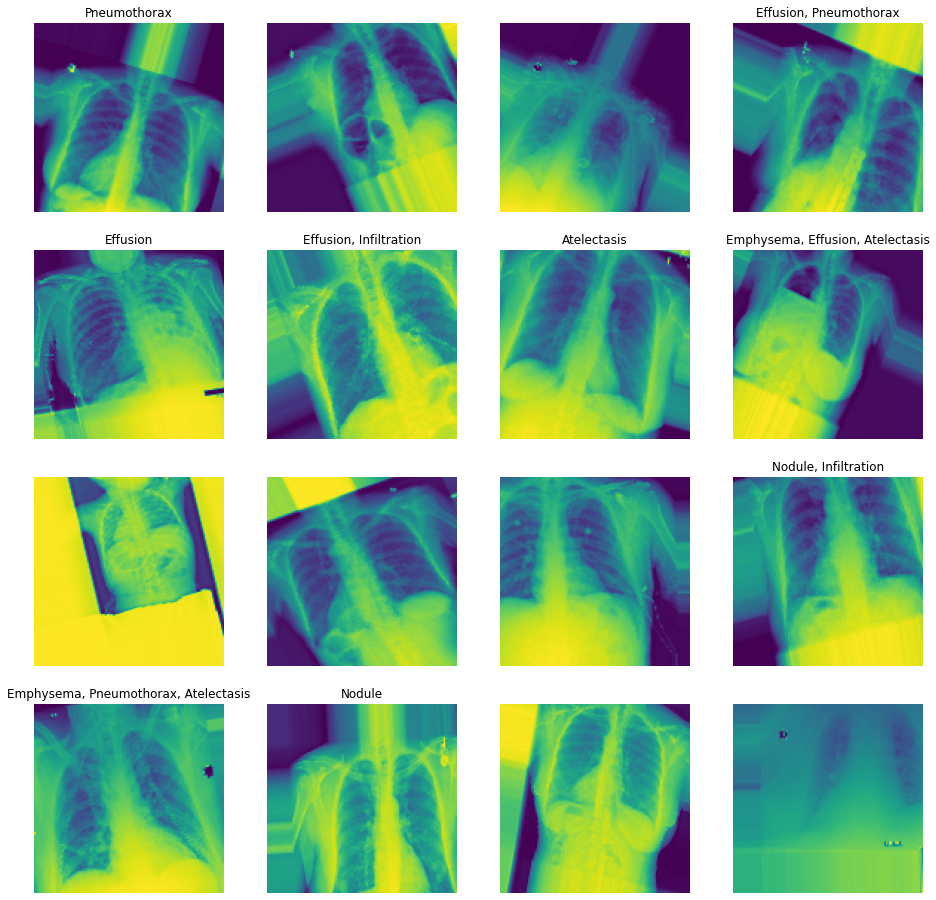

In [ ]:
t_x, t_y = next(train_flow)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (c_x, c_y, c_ax) in zip(t_x, t_y, m_axs.flatten()):
    c_ax.imshow(c_x[:,:,0])
    c_ax.set_title(', '.join([n_class for n_class, n_score in zip(pathology_list, c_y) 
                             if n_score>0.5]))
    c_ax.axis('off')


In [ ]:
x=[]
y=[]
a=[]

In [ ]:
for i in range(len(train_Y)) : 
  x.append(train_Y[i]) 

for i in range(len(test_Y)) : 
  y.append(test_Y[i])   

for i in range(len(t_y)) : 
  a.append(t_y[i])   

In [ ]:
np.array(x).shape


(16, 14)

In [ ]:
np.array(y).shape

(2048, 14)

In [ ]:
np.array(a).shape

(16, 14)

In [ ]:
train_y2 = np.reshape(x, (16,14))
test_y2 = np.reshape(y, (2048,14))
t_y2 = np.reshape(a, (16,14))

In [ ]:
import tensorflow as tf
from keras.applications.mobilenet import MobileNet
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten
from keras.models import Sequential
mobilenet_model = MobileNet(input_shape =  t_x.shape[1:], 
                                 include_top = False, weights = None)
multi_disease_model = Sequential()

multi_disease_model.add(mobilenet_model)
multi_disease_model.add(GlobalAveragePooling2D())
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(512))
multi_disease_model.add(Dropout(0.5))
multi_disease_model.add(Dense(len(pathology_list), activation = 'sigmoid'))
multi_disease_model.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                           metrics = ['binary_accuracy', 'mae'])
multi_disease_model.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228288   
 nal)                                                            
                                                                 
 global_average_pooling2d_15  (None, 1024)             0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_30 (Dropout)        (None, 1024)              0         
                                                                 
 dense_30 (Dense)            (None, 512)               524800    
                                                                 
 dropout_31 (Dropout)        (None, 512)               0         
                                                                 
 dense_31 (Dense)            (None, 14)              

In [ ]:
train_X.shape

(16, 128, 128, 1)

In [ ]:
history = multi_disease_model.fit(train_X,train_y2,
                                  steps_per_epoch=10,
                                  validation_data = (t_x, t_y2), 
                                  epochs = 10)
                                  

Epoch 1/10
10/10 [==============================] - 5s 231ms/step - loss: 0.3694 - binary_accuracy: 0.8786 - mae: 0.1629 - val_loss: 0.6089 - val_binary_accuracy: 0.9286 - val_mae: 0.4552
Epoch 2/10
10/10 [==============================] - 2s 178ms/step - loss: 0.2617 - binary_accuracy: 0.9179 - mae: 0.0947 - val_loss: 0.5245 - val_binary_accuracy: 0.8750 - val_mae: 0.4042
Epoch 3/10
10/10 [==============================] - 2s 176ms/step - loss: 0.3081 - binary_accuracy: 0.9107 - mae: 0.0987 - val_loss: 0.4612 - val_binary_accuracy: 0.9286 - val_mae: 0.3624
Epoch 4/10
10/10 [==============================] - 2s 177ms/step - loss: 0.3058 - binary_accuracy: 0.9179 - mae: 0.0906 - val_loss: 0.4085 - val_binary_accuracy: 0.9286 - val_mae: 0.3234
Epoch 5/10
10/10 [==============================] - 2s 176ms/step - loss: 0.2829 - binary_accuracy: 0.9357 - mae: 0.0806 - val_loss: 0.3781 - val_binary_accuracy: 0.9286 - val_mae: 0.2978
Epoch 6/10
10/10 [==============================] - 2s 176ms

In [ ]:
y_pred = multi_disease_model.predict(test_X)

In [ ]:
y_pred

array([[0.53601825, 0.48080504, 0.14387482, ..., 0.12615812, 0.08347082,
        0.10299444],
       [0.53601825, 0.48080504, 0.14387482, ..., 0.12615815, 0.08347082,
        0.10299444],
       [0.53601825, 0.48080504, 0.14387485, ..., 0.12615812, 0.08347082,
        0.10299444],
       ...,
       [0.5360182 , 0.48080504, 0.14387482, ..., 0.12615815, 0.08347082,
        0.10299444],
       [0.53601825, 0.48080504, 0.14387485, ..., 0.1261583 , 0.08347082,
        0.10299444],
       [0.53601825, 0.480805  , 0.14387485, ..., 0.1261583 , 0.08347082,
        0.10299441]], dtype=float32)

In [ ]:
np.min(y_pred)

0.08347079

In [ ]:
print('test accuracy = ',multi_disease_model.evaluate(test_X,test_y2, verbose=0)[1])

test accuracy =  0.880231499671936
